# <font color='salmon'> Importing the Libraries

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np # linear algebra
import pandas as pd# data processing, CSV file I/O (e.g. pd.read_csv)
from matplotlib import pyplot as plt
import seaborn as sns
import missingno as msno

from subprocess import check_output
from tqdm.notebook import tqdm
import plotly.graph_objs as go
import plotly.offline as py
import datetime
from sort_dataframeby_monthorweek import *
import calendar
import os
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

#For statistical tests
import scipy.stats as st

#For formula notation (similar to R)
import statsmodels.formula.api as smf

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import xgboost as xgb

### Memory Functions

In [2]:
#Function for calculating memory usage of dataframe
def memory_usage(df):
    memory=round(df.memory_usage(index=True).sum(),3)
    return memory/ 1024**2

In [3]:
# Reference: https://www.kaggle.com/gemartin/load-data-reduce-memory-usage

def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of Dataframe is {:.3f} MB'.format(start_mem))
    
    for col in tqdm(df.columns):
        col_type = df[col].dtype
        
        if col_type != object and col_type.name != 'category' and 'datetime' not in col_type.name:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        elif 'datetime' not in col_type.name:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.3f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

# <font color='salmon'> Data

In [4]:
df_train = pd.read_csv(
    'train.csv', usecols=[1, 2, 3, 4, 5],
    parse_dates=["date"], low_memory = False)

print("Memory used by Train Dataframe is %.3f"%memory_usage(df_train),"MB")

Memory used by Train Dataframe is 4787.332 MB


In [5]:
#Reducing memory usage of train dataframe
df_train=reduce_mem_usage(df_train)

Memory usage of Dataframe is 4787.332 MB


  0%|          | 0/5 [00:00<?, ?it/s]

Memory usage after optimization is: 2154.300 MB
Decreased by 55.0%


In [6]:
#Reading stores.csv
df_stores = pd.read_csv('stores.csv')
print("Memory used by Stores Dataframe --> %.3f"%memory_usage(df_stores),"MB")
df_stores.head()

Memory used by Stores Dataframe --> 0.002 MB


,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [7]:
df_items = pd.read_csv('items.csv')
print("Memory used by Items Dataframe --> %.3f"%memory_usage(df_items),"MB")
df_items.head()

Memory used by Items Dataframe --> 0.125 MB


,item_nbr,family,class,perishable
0,96995,GROCERY I,1093,0
1,99197,GROCERY I,1067,0
2,103501,CLEANING,3008,0
3,103520,GROCERY I,1028,0
4,103665,BREAD/BAKERY,2712,1


In [8]:
#Reading transactions.csv
df_transactions = pd.read_csv('transactions.csv',parse_dates=['date'])
print("Memory used by Transactions Dataframe --> %.3f"%memory_usage(df_transactions),"MB")
df_transactions.head()

Memory used by Transactions Dataframe --> 1.911 MB


,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [9]:
#Reading holidays_events.csv
df_holidays_events = pd.read_csv('holidays_events.csv',parse_dates=['date'])
print("Memory used by Holidays_events Dataframe --> %.3f"%memory_usage(df_holidays_events),"MB")
df_holidays_events.head()

Memory used by Holidays_events Dataframe --> 0.014 MB


,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [10]:
#Read oil.csv
df_oil = pd.read_csv('oil.csv',parse_dates=['date'])
print("Memory used by Oil Dataframe --> %.3f"%memory_usage(df_oil),"MB")
df_oil.tail()

Memory used by Oil Dataframe --> 0.019 MB


,date,dcoilwtico
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96
1217,2017-08-31,47.26


# <font color='salmon'> EDA on Train Dataset

Reading Train File

In [11]:
df_train.head()

,date,store_nbr,item_nbr,unit_sales,onpromotion
0,2013-01-01,25,103665,7.0,NaN
1,2013-01-01,25,105574,1.0,NaN
2,2013-01-01,25,105575,2.0,NaN
3,2013-01-01,25,108079,1.0,NaN
4,2013-01-01,25,108701,1.0,NaN


In [12]:
def resumetable(df):
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values
    summary['Missing(% of Total values)']= (100 * summary['Missing']) / df.shape[0]
    summary['Uniques'] = df.nunique().values
    summary['First Value'] = df.loc[0].values
    summary['Second Value'] = df.loc[1].values
    return summary

In [13]:
resumetable(df_train)

Dataset Shape: (125497040, 5)


,Name,dtypes,Missing,Missing(% of Total values),Uniques,First Value,Second Value
0,date,datetime64[ns],0,0.000000,1684,2013-01-01 00:00:00,2013-01-01 00:00:00
1,store_nbr,int8,0,0.000000,54,25,25
2,item_nbr,int32,0,0.000000,4036,103665,105574
3,unit_sales,float32,0,0.000000,258474,7.0,1.0
4,onpromotion,category,21657651,17.257499,2,NaN,NaN


In [14]:
def describe(df):
    return df.describe().T
describe(df_train)

,count,mean,std,min,25%,50%,75%,max
store_nbr,125497040.0,27.464578,16.330510,1.0,12.0,28.0,43.0,54.0
item_nbr,125497040.0,972769.152723,520533.598616,96995.0,522383.0,959500.0,1354380.0,2127114.0
unit_sales,125497040.0,5.319669,23.067142,-15372.0,2.0,4.0,9.0,89440.0


Features :
1. Date 
2. Store Number (Integers representing different stores)
3. Item Number (Integers representing different items)
4. On Promotion (Logical feature, Telling whether the particular item sold had been assigned a special promotion pricing at the time in the specific store. This feature contains many NA values.)

Target Variable --> Unit Sales (i.e. how many units of the specific item were sold in that store on that day. Negative values mean that this particular item was returned)

In [ ]:
# Group By store_nbr and Sum of unit_sales for each store_nbr
df = df_train.groupby(['store_nbr'], as_index=False).agg({'unit_sales':'sum'}).sort_values("unit_sales", ascending=False) 
df.head()

#### Unit sales of Each Store

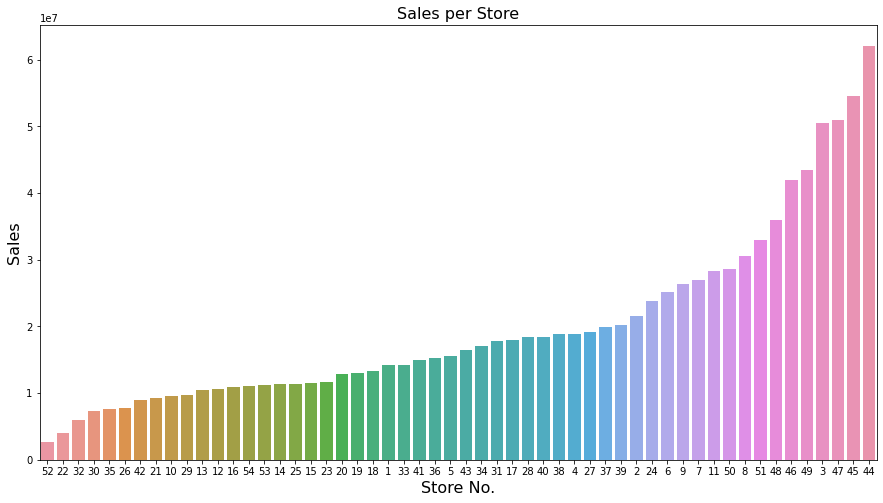

In [15]:
#PLotting store_nbr Vs unit_sales
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
ax = sns.barplot(x = df.store_nbr, y= "unit_sales", data = df, order= df.sort_values("unit_sales").store_nbr )
plt.title('Sales per Store',fontsize=16)
plt.ylabel('Sales',fontsize=16)
plt.xlabel('Store No.',fontsize=16)
plt.show()




* The store numbers range from 1 to 54.
* Store No. 44 has the maximum sales.

*   Store No. 52 has the minimum sales.



#### Unit sales of Each Item

In [15]:
# Group By item_nbr and Sum of unit_sales for each item_nbr
x = df_train.groupby(['item_nbr'], as_index=False).agg({'unit_sales':'sum'})
x= x.sort_values('unit_sales', ascending=False)
x= x.head(15)

In [17]:
item = x['item_nbr'].values.tolist()

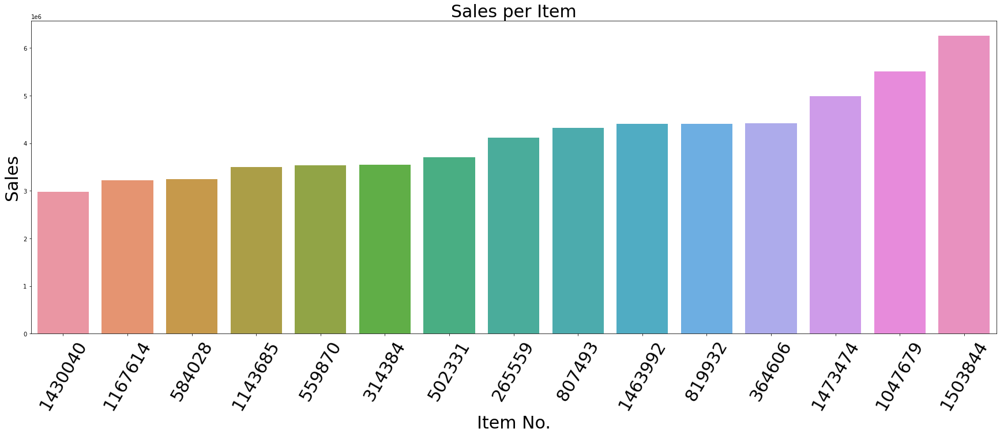

In [46]:
#Plotting item_nbr Vs unit_sales
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
ax = sns.barplot(x = x.item_nbr, y= "unit_sales", data = x, order= x.sort_values("unit_sales").item_nbr)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 60, fontsize = 30)
plt.title('Sales per Item',fontsize=30)
plt.ylabel('Sales',fontsize=30)
plt.xlabel('Item No.',fontsize=30)
plt.show()




*  Only few items have very high sales.
*  Variation can be seen in sales for different item no.'s 



#### Sales per Year

In [18]:
# Adding Year as a Feature
df_train["year"]=df_train["date"].dt.year
df_train.head()

,date,store_nbr,item_nbr,unit_sales,onpromotion,year
0,2013-01-01,25,103665,7.0,NaN,2013
1,2013-01-01,25,105574,1.0,NaN,2013
2,2013-01-01,25,105575,2.0,NaN,2013
3,2013-01-01,25,108079,1.0,NaN,2013
4,2013-01-01,25,108701,1.0,NaN,2013


In [19]:
# Group By Year and Sum of unit_sales for each year
x = df_train.groupby(['year'], as_index=False).agg({'unit_sales':'sum'})
x.head()

,year,unit_sales
0,2013,140418000.0
1,2014,209474128.0
2,2015,240867824.0
3,2016,288633376.0
4,2017,194216944.0


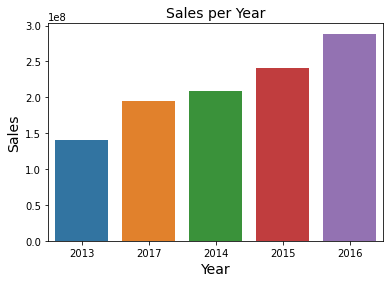

In [20]:
#Plotting year Vs unit_sales
sns.barplot(x = x.year, y = 'unit_sales', data = x, order= x.sort_values("unit_sales").year)
plt.title('Sales per Year',fontsize=14)
plt.ylabel('Sales',fontsize=14)
plt.xlabel('Year',fontsize=14)
plt.show()

del x



*    Given Sales Data is from 2013 to 2017.
*   Sales are increasing each year except 2017.



In [21]:
# Viewing Data only for 2017
df_train[df_train["date"].dt.year==2017].tail()

,date,store_nbr,item_nbr,unit_sales,onpromotion,year
125497035,2017-08-15,54,2089339,4.0,False,2017
125497036,2017-08-15,54,2106464,1.0,True,2017
125497037,2017-08-15,54,2110456,192.0,False,2017
125497038,2017-08-15,54,2113914,198.0,True,2017
125497039,2017-08-15,54,2116416,2.0,False,2017



* The reason behind decrease in sales in 2017 is that 2017 only has records till 15th of August. 

#### Sales per Month for Every Year

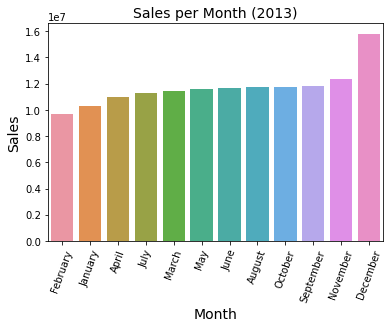

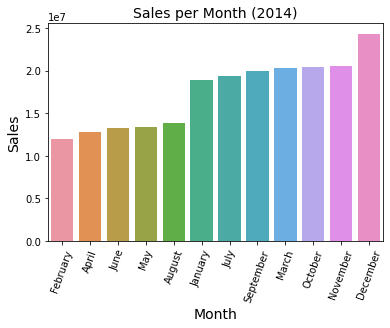

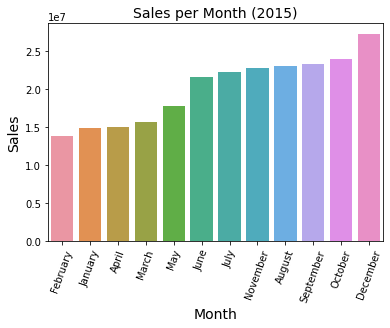

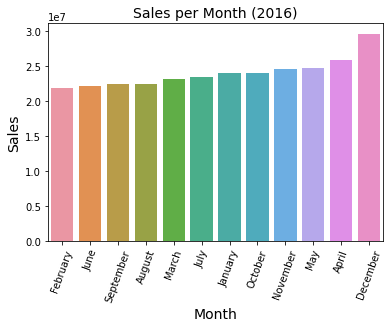

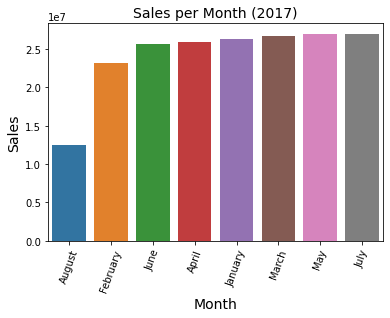

In [22]:
for year in df_train["date"].dt.year.unique():
    #Filtering data for specific year
    x = df_train[df_train["date"].dt.year == year]

    #Extracting month name from date
    x['month']=x['date'].dt.month_name()

    #Grouping data by months and adding unit_sales
    x=x.groupby(['month'], as_index=False).agg({'unit_sales':'sum'})
    
    #Sorting dataframe by Month
    x = Sort_Dataframeby_Month(df=x,monthcolumnname='month')

    #Plotting month Vs unit_sales for every year
    #plt.figure(figsize=(12,8))
    sns.barplot(x = x.month, y = 'unit_sales', data = x, order= x.sort_values("unit_sales").month)
    plt.xticks(rotation=70)
    plt.title("Sales per Month ("+str(year)+")",fontsize=14)
    plt.ylabel('Sales',fontsize=14)
    plt.xlabel('Month',fontsize=14)
    plt.show()
    del x


*  December month has the maximum sales every year 
( which makes sense because of the Christmas and holiday season.) 

*  February month has the minimum sales every year.


*  This confirms that the sales vary with the 'Date' and there is a seasonality factor present in the data.



Note: Sales data for year 2017 is only till 15th of August.

### Exploring weekly pattern if any:

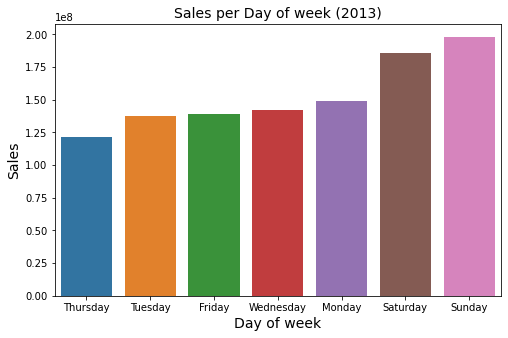

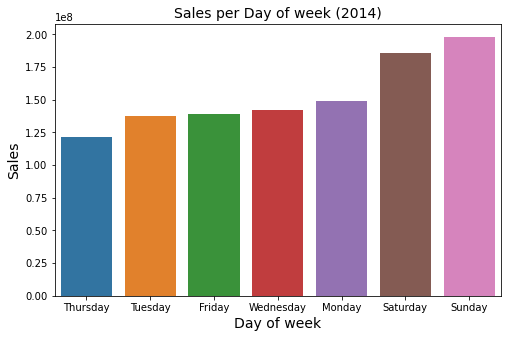

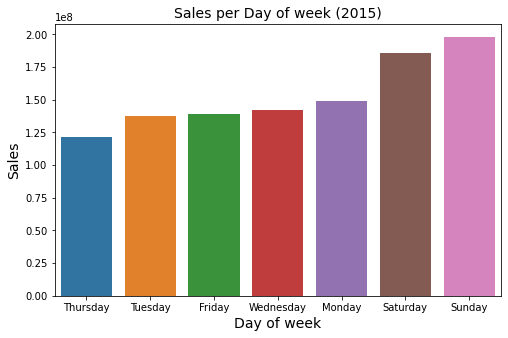

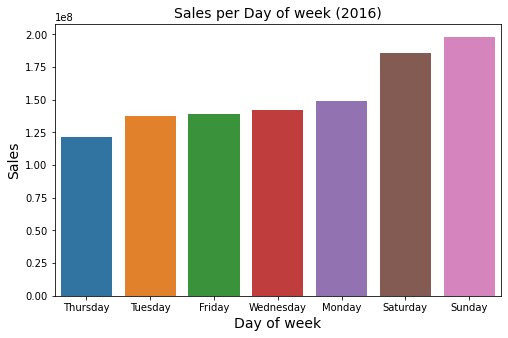

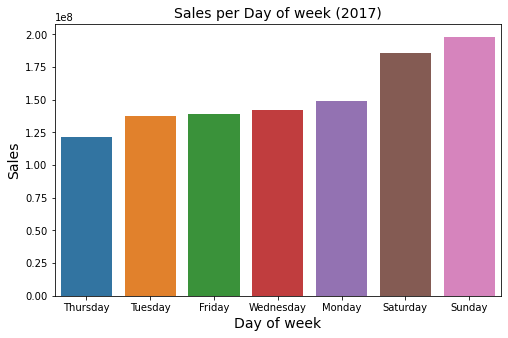

In [23]:
for year in df_train["date"].dt.year.unique():
    #Filtering data for specific year
    x = df_train[df_train["date"].dt.year == year]

    #Adding Day of Week as a Feature
    df_train['day_of_week'] = df_train['date'].dt.day_name()
    # Group By day_of_week and Sum of unit_sales for each day_of_week
    x = df_train.groupby(['day_of_week'], as_index=False).agg({'unit_sales':'sum'})

    #Sorting Dataframe by Week_day
    x = Sort_Dataframeby_Weekday(df=x,Weekdaycolumnname='day_of_week')

    #Plotting day_of_week Vs unit_sales
    plt.figure(figsize=(8,5))
    sns.barplot(x = x.day_of_week, y = 'unit_sales', data = x, order= x.sort_values("unit_sales").day_of_week)
    plt.title("Sales per Day of week ("+str(year)+")", fontsize= 14)
    plt.xlabel('Day of week', fontsize= 14)
    plt.ylabel('Sales', fontsize= 14)

    del x

#### Sales per Day of Week


* Sunday has the maximum sales followed by Saturday (i.e. Weekends seem to be prefered as compared to Weekdays to shop at this supermaket.)
* Thursday has the least sales. 
*   Day of Week can be used as a feature to predict sales

### Wage Payment Impact

In [197]:
df_train['date_only']  = df_train['date'].apply(lambda x: (str(x)[8:10]))
def date(df):
    if ((df=='15') | (df=='30')):
        return 1
    else:
        return 0
df_train['wages_paid']  = df_train['date_only'].apply(date)

In [198]:
#Pie plot of no. of items Vs perishable or not i.e. 0 or 1
x = go.Pie(
    labels = ['No Public Sector Wage Payment', 'Wage Payment'], 
    values = df_train.wages_paid.value_counts().values,
    marker=dict(colors=["#3498DB", "#F39C12"]),
    text=['No Public Sector Wage Payment', 'Wage Payment'],
    hoverinfo="label+value",
    domain = dict(x=[0, 0.48], y=[0.5, 1]),
    showlegend = False
)

item_pie_layout = dict(
    width=800, height=700,
    title="Percentage of Wage Payment Days "
)

x = go.Figure(data = x, layout=item_pie_layout)
py.iplot(x)

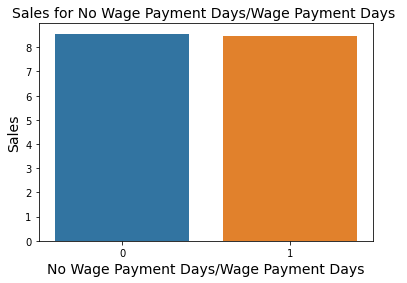

In [199]:
x = df_train.groupby(['wages_paid'], as_index=False).agg({'unit_sales':'sum', 'wages_paid':'count'}) 
x['unit_sales_normalized'] = x['unit_sales']/x['wages_paid']
#Plotting perishable or not  Vs unit_sales
fig, ax = plt.subplots()
ax = sns.barplot(x = x.index, y= 'unit_sales_normalized', data = x)
plt.ylabel('Sales', fontsize= 14)
plt.xlabel('No Wage Payment Days/Wage Payment Days', fontsize= 14)
plt.title('Sales for No Wage Payment Days/Wage Payment Days ',fontsize= 14)
plt.show()

#### No. of Items on promotion

In [29]:
#Pie plot showing information about promotion column
pie_perish_trace = go.Pie(
    labels = ['Not-on_Promotion','on_Promotion'], 
    values = df_train.onpromotion.value_counts().values,
    text=['Not-on_Promotion','on_Promotion'],
    hoverinfo="label+value",
    domain = dict(x=[0, 0.48], y=[0.5, 1]),
    showlegend = False
)

item_pie_layout = dict(
    width=800, height=700,
    title="Percentage of items on Promotion "
)

pie_perish_fig = go.Figure(data=pie_perish_trace, layout=item_pie_layout)
py.iplot(pie_perish_fig)

del pie_perish_trace,pie_perish_fig



* Small fraction of items are on promotion 
* Majority of items are not on promotion.






#### Sales for on promotion/not on promotion Items

In [56]:
df_train['onpromotion'] = df_train['onpromotion'].replace(True,1)
df_train['onpromotion'] = df_train['onpromotion'].replace(False,0)

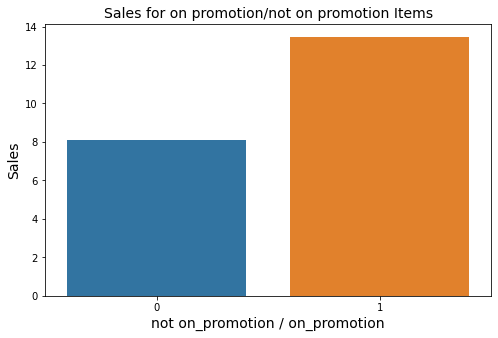

In [60]:
# Group By day_of_week and Sum of unit_sales for each day_of_week
x = df_train.groupby(['onpromotion'], as_index=False).agg({'unit_sales':'sum','item_nbr':'count'})
x['unit_sales_normalized'] = x['unit_sales']/x['item_nbr']


#Plotting day_of_week Vs unit_sales
plt.figure(figsize=(8,5))
sns.barplot(x= x.index, y= x.unit_sales_normalized, data = x, order= x.sort_values("unit_sales_normalized").index)
plt.title('Sales for on promotion/not on promotion Items', fontsize= 14)
plt.xticks((0,1))
plt.xlabel('not on_promotion / on_promotion', fontsize= 14)
plt.ylabel('Sales', fontsize= 14)

del x

* Sales for Items on Promotion are higher on an average

# <font color='salmon'> EDA On Stores Dataset

#### Checking Missing Values and other properties of data

In [34]:
resumetable(df_stores)

Dataset Shape: (54, 5)


,Name,dtypes,Missing,Missing(% of Total values),Uniques,First Value,Second Value
0,store_nbr,int64,0,0.0,54,1,2
1,city,object,0,0.0,22,Quito,Quito
2,state,object,0,0.0,16,Pichincha,Pichincha
3,type,object,0,0.0,5,D,D
4,cluster,int64,0,0.0,17,13,13


#### No of Stores per State

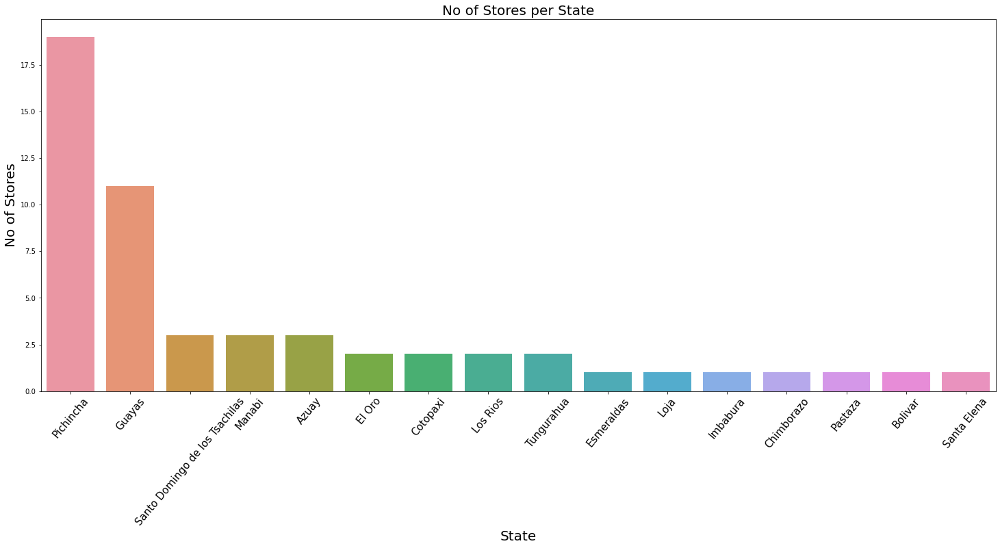

In [36]:
#Fetching no.of stores in each state
x=df_stores.state.value_counts().to_frame()
#Plotting state Vs no.of stores
fig, ax = plt.subplots()
fig.set_size_inches(25, 10)
ax = sns.barplot(x = x.index, y= "state",data=x)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 50, fontsize = 15)
plt.title('No of Stores per State',fontsize=20)
plt.ylabel('No of Stores',fontsize=20)
plt.xlabel('State',fontsize=20)

plt.show()

del x

*  Pichincha has maximum no. of stores i.e 19 stores,followed by Guayas with 11 stores

* Other States have no. of stores between 1 and 3.




#### Sales per State

In [23]:
#Merging store dataframe with sales dataframe
store_sales=df_train.merge(df_stores, how='inner', on='store_nbr')
store_sales=reduce_mem_usage(store_sales)

store_sales.head()

Memory usage of Dataframe is 6941.632 MB


  0%|          | 0/9 [00:00<?, ?it/s]

Memory usage after optimization is: 3590.501 MB
Decreased by 48.3%


,date,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster
0,2013-01-01,25,103665,7.0,NaN,Salinas,Santa Elena,D,1
1,2013-01-01,25,105574,1.0,NaN,Salinas,Santa Elena,D,1
2,2013-01-01,25,105575,2.0,NaN,Salinas,Santa Elena,D,1
3,2013-01-01,25,108079,1.0,NaN,Salinas,Santa Elena,D,1
4,2013-01-01,25,108701,1.0,NaN,Salinas,Santa Elena,D,1


In [61]:
x = store_sales.groupby(['state'], as_index=False).agg({'unit_sales':'sum','store_nbr':'count'}) 
x['unit_sales_normalized'] = x['unit_sales']/x['store_nbr']

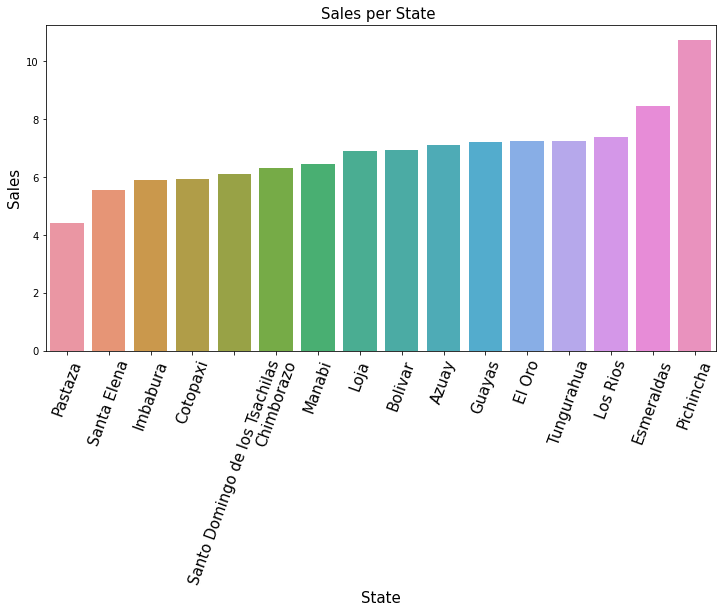

In [62]:
#Group by state and sum of sales for each state


#Plotting state Vs unit_sales
fig, ax = plt.subplots()
fig.set_size_inches(12, 6)
ax = sns.barplot(x = x.state, y= 'unit_sales_normalized', data = x, order= x.sort_values('unit_sales_normalized').state)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 70, fontsize = 15)
plt.title("Sales per State ",fontsize=15)
plt.ylabel('Sales',fontsize=15)
plt.xlabel('State',fontsize=15)
plt.show()

del x

* Pichincha has maximum sale followed by Esmeraldas.
* Other States have much lower sales.
* States shows a certain amount of variation in the average sale numbers.



#### No of Stores per City

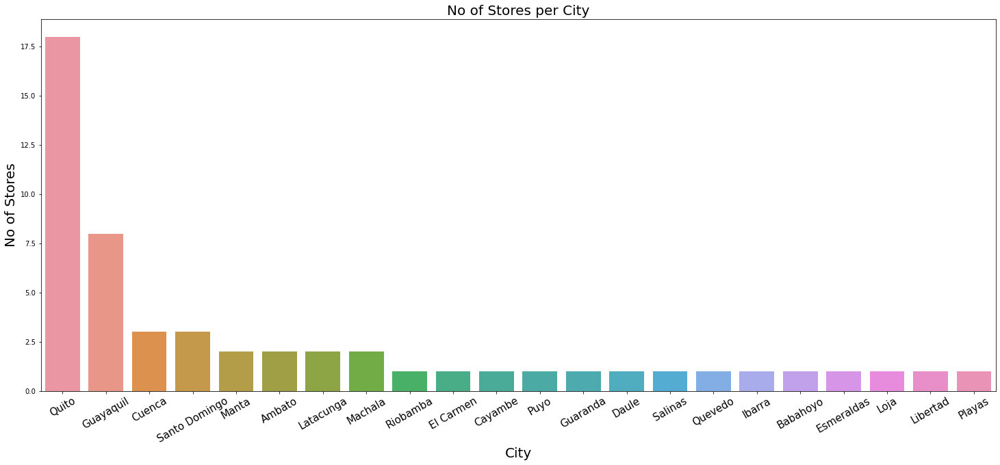

In [41]:
#Fetching no.of stores in each city
x=df_stores.city.value_counts().to_frame()

#Plotting city Vs no.of stores
fig, ax = plt.subplots()
fig.set_size_inches(25, 10)
ax = sns.barplot(x = x.index, y= "city",data=x)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 30, fontsize = 15)
plt.title('No of Stores per City',fontsize=20)
plt.xlabel('City',fontsize=20)
plt.ylabel('No of Stores',fontsize=20)
plt.show()

del x



*  Quito has maximum no. of stores i.e. 18 stores followed by
Guayaquil with 8 stores

*  Most of the Cities have 1 to 3 no. of stores




#### Sales per City

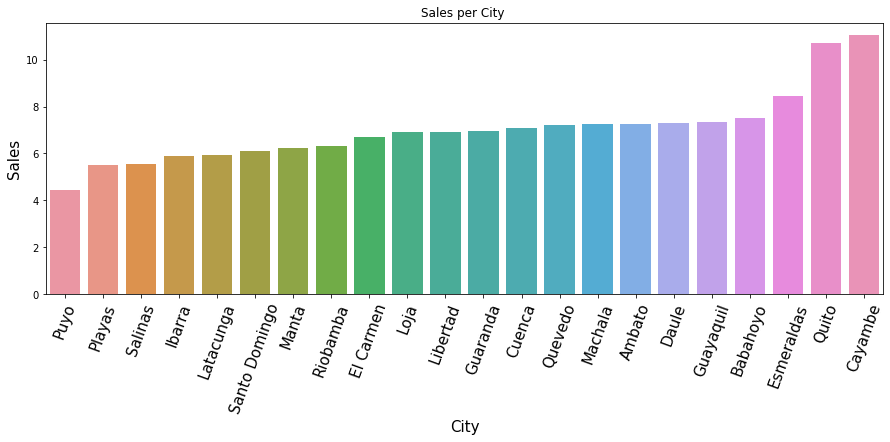

In [41]:
#Group by city and sum of sales for each city
x = store_sales.groupby(['city'], as_index=False).agg({'unit_sales':'sum','store_nbr':'count'}) 
x['unit_sales_normalized'] = x['unit_sales']/x['store_nbr']


#Plotting city Vs unit_sales
fig, ax = plt.subplots()
fig.set_size_inches(15, 5)
ax = sns.barplot(x = x.city, y= 'unit_sales_normalized', data = x, order= x.sort_values('unit_sales_normalized').city)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 70, fontsize = 15)
plt.title("Sales per City ")
plt.ylabel('Sales',fontsize=15)
plt.xlabel('City',fontsize=15)
plt.show()




*  Cayambe has maximum sales overall followed by Quito
* Cities shows a certain amount of variation in the average sale numbers.



#### No of Stores per Store Type

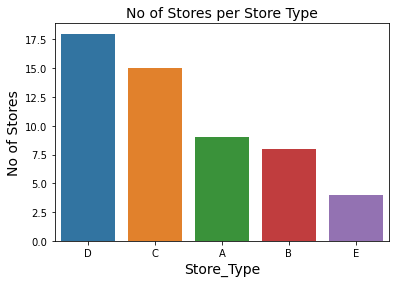

In [43]:
#Fetching no of stores for each store type
x=df_stores.type.value_counts().to_frame()

#Plotting  store type Vs no.of stores
fig, ax = plt.subplots()
ax = sns.barplot(x = x.index, y= "type",data=x)
plt.title("No of Stores per Store Type",fontsize=14)
plt.xlabel('Store_Type',fontsize=14)
plt.ylabel('No of Stores',fontsize=14)
plt.show()



*  Among the types, we see that D and “C” are the most frequent, with “A” and “B” having similar medium frequency and “E” only accounting for 4 stores.



*  Type D has maximum no. of stores followed by C.
*  Type E has minimum no. of stores.



#### Sales per Store Type

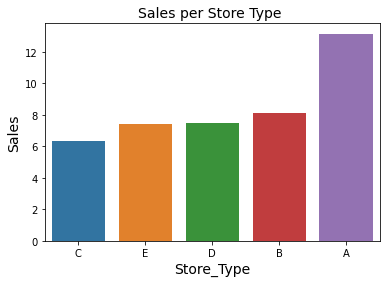

In [63]:
x = store_sales.groupby(['type'], as_index=False).agg({'unit_sales':'sum','store_nbr':'count'}) 
x['unit_sales_normalized'] = x['unit_sales']/x['store_nbr']

#Plotting store type Vs unit_sales
fig, ax = plt.subplots()
ax = sns.barplot(x = x.type, y= 'unit_sales_normalized', data = x, order= x.sort_values('unit_sales_normalized').type)
plt.title("Sales per Store Type ",fontsize=14)
plt.ylabel('Sales',fontsize=14)
plt.xlabel('Store_Type',fontsize=14)
plt.show()




* Types A and B have much higher sales as compared to other Types. But Type A has approx. 1/2 no. of stores as compared to Type D which means Type A stores could be bigger in size or could be in prime location

*  Type C has minimum sales 



#### No of Stores per Cluster

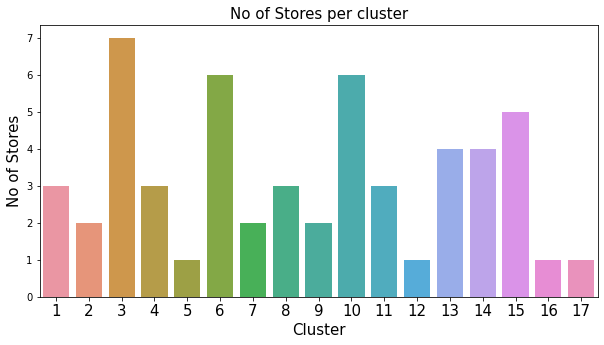

In [65]:
#Fetching no of stores for each store cluster
x=df_stores.cluster.value_counts().to_frame()

#Plotting store cluster Vs no.of stores
fig, ax = plt.subplots()
fig.set_size_inches(10, 5)
ax = sns.barplot(x = x.index, y= "cluster",data=x)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0, fontsize = 15)
plt.title("No of Stores per cluster",fontsize=15)
plt.xlabel('Cluster',fontsize=15)
plt.ylabel('No of Stores',fontsize=15)
plt.show()


* 54 unique stores and these are clustered into 17 
unique groups
* Cluster no. 3 has maximum no. of stores followed by 6 and 10.



#### Sales per Cluster

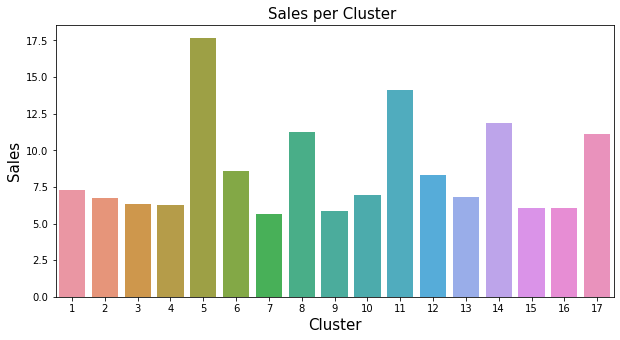

In [66]:
x = store_sales.groupby(['cluster'], as_index=False).agg({'unit_sales':'sum','store_nbr':'count'}) 
x['unit_sales_normalized'] = x['unit_sales']/x['store_nbr']

#Plotting store cluster Vs unit_sales
fig, ax = plt.subplots()
fig.set_size_inches(10, 5)
ax = sns.barplot(x = x.cluster, y= 'unit_sales_normalized', data = x)
#ax.set_xticklabels(ax.get_xticklabels(), rotation = 70, fontsize = 15)
plt.title("Sales per Cluster ",fontsize=15)
plt.ylabel('Sales',fontsize=15)
plt.xlabel('Cluster',fontsize=15)
plt.show()




*   Cluster 5 has maximum sales.
*   Cluster 7 has minimum sales.
*   The cluster feature shows a clear variation in sales numbers.


In [67]:
del df_stores,store_sales

# <font color='salmon'> EDA on Items Dataset

#### Looking into the DataFrame

In [71]:
resumetable(df_items)

Dataset Shape: (4100, 4)


,Name,dtypes,Missing,Missing(% of Total values),Uniques,First Value,Second Value
0,item_nbr,int64,0,0.0,4100,96995,99197
1,family,object,0,0.0,33,GROCERY I,GROCERY I
2,class,int64,0,0.0,337,1093,1067
3,perishable,int64,0,0.0,2,0,0


#### No of Items per Item Family

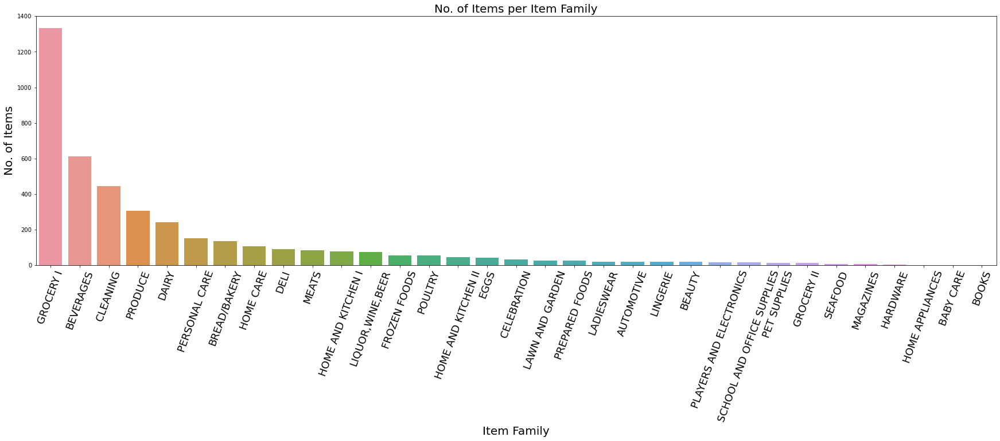

In [51]:
x=df_items.family.value_counts().to_frame()

#Plotting item family Vs no.of items
fig, ax = plt.subplots()
fig.set_size_inches(30, 8)
ax = sns.barplot(x = x.index, y= "family", data = x)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 70, fontsize = 18)
plt.ylabel('No. of Items', fontsize= 20)
plt.xlabel('Item Family', fontsize= 20)
plt.title('No. of Items per Item Family',fontsize= 20)
plt.show()


* Grocery I has the maximum no. of items followed by Beverages and Cleaning .
* Some of the Families such as Home Appliances, Baby Care, Books has almost no items.





In [81]:
#Group by family and perishable feature 
x = df_items.groupby(['family', 'perishable']).size().to_frame()


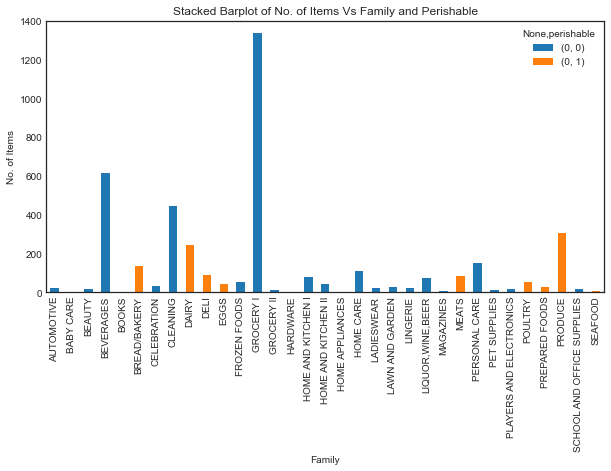

In [82]:
#Plotting stacked barplot family and perishable feature Vs no. of items
plt.style.use('seaborn-white')
x.unstack().plot(kind='bar',stacked=True, figsize=(10,5),  grid=False)
plt.title('Stacked Barplot of No. of Items Vs Family and Perishable')
plt.xlabel('Family')
plt.ylabel('No. of Items')
plt.show()

del x


* No family contains both perishable and non-perishable items, which means we can directly map an item's family to its perishability. 




#### Sales per Item Family

In [63]:
#Merging items dataframe and sales dataframe
item_sales=df_train.merge(df_items, how='inner', on='item_nbr')
item_sales=reduce_mem_usage(item_sales)

item_sales.head()

Memory usage of Dataframe is 5984.165 MB


  0%|          | 0/8 [00:00<?, ?it/s]

Memory usage after optimization is: 3590.501 MB
Decreased by 40.0%


,date,store_nbr,item_nbr,unit_sales,onpromotion,family,class,perishable
0,2013-01-01,25,103665,7.0,NaN,BREAD/BAKERY,2712,1
1,2013-01-02,1,103665,2.0,NaN,BREAD/BAKERY,2712,1
2,2013-01-02,2,103665,5.0,NaN,BREAD/BAKERY,2712,1
3,2013-01-02,3,103665,6.0,NaN,BREAD/BAKERY,2712,1
4,2013-01-02,4,103665,2.0,NaN,BREAD/BAKERY,2712,1


In [89]:
item_sales[item_sales['perishable']==1].sort_values("unit_sales", ascending = False)[item_sales['store_nbr']==44]['item_nbr'].unique()

array([1503844,  903283, 1473474, 1503847, 1695931, 1642399, 1584575,
        208384,  699686, 1695835, 1502392, 1473410, 1751174, 1695935,
       1473478,  159156, 1926217, 1695836,  378685, 1473404, 1751175,
        564287, 1473479,  903284,  426155, 1584576, 1642400, 1501508,
        903285, 1751176, 1686656, 1695837, 1696029,  578097, 1473428,
       1333307, 1625605, 1693648, 1696007, 1960765,  699687, 1427659,
       1501570, 1473403, 1239897, 1695845, 1473482,  895291, 1179580,
       1693656,  507969, 1473393,  903286, 1609719,  409738,  265279,
       1503855,  939207, 1695900, 1695823, 1695887, 1695966, 1695886,
        988459,  507478, 2081095, 1695872, 1313222, 1913462,  584028,
       1695828, 1489660, 1502391, 1309245, 1239859, 1309246, 1686664,
       1695961,  671908,  502331, 1239901, 1473394,  557420, 1473476,
       1489836, 1695875, 1660271, 1473406, 1239902,  582864,  871514,
        871511, 2081064, 1695950, 1695830,  582863, 1149069, 1978835,
       1239858,  457

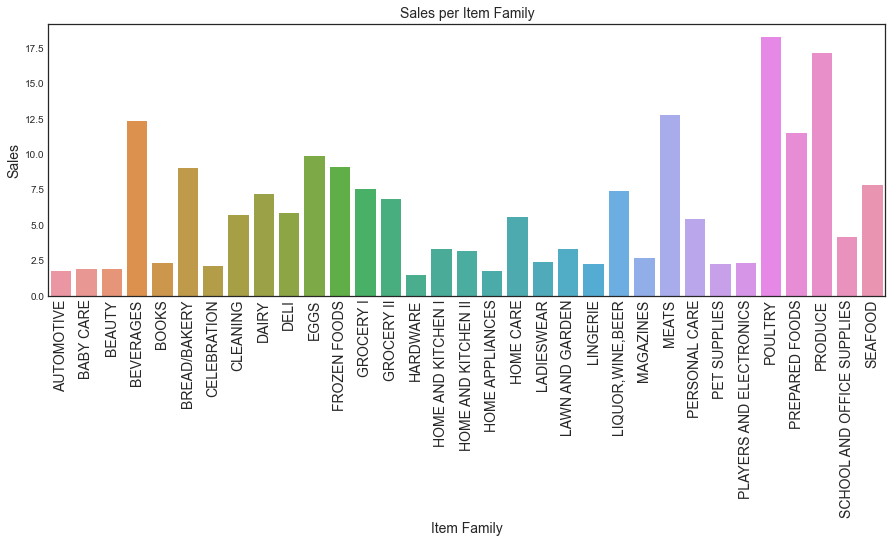

In [85]:
x = item_sales.groupby(['family'], as_index=False).agg({'unit_sales':'sum', 'item_nbr': "count"}) 
x['unit_sales_normalized'] = x['unit_sales']/x['item_nbr']
#Plotting item family Vs unit_sales
fig, ax = plt.subplots()
fig.set_size_inches(15, 5)
ax = sns.barplot(x = x.family, y= 'unit_sales_normalized', data = x)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, fontsize = 14)
plt.ylabel('Sales', fontsize= 14)
plt.xlabel('Item Family', fontsize= 14)
plt.title('Sales per Item Family',fontsize= 14)
plt.show()

del x



*  Poultry is the best selling family 
*   Item family shows variation in sales number




#### No. of Items Perishable/Non-Perishable

In [62]:
#Pie plot of no. of items Vs perishable or not i.e. 0 or 1
x = go.Pie(
    labels = ['non-perishable', 'perishable'], 
    values = df_items.perishable.value_counts().values,
    marker=dict(colors=["#3498DB", "#F39C12"]),
    text=['non-perishable','perishable'],
    hoverinfo="label+value",
    domain = dict(x=[0, 0.48], y=[0.5, 1]),
    showlegend = False
)

item_pie_layout = dict(
    width=800, height=700,
    title="Percentage of perishable items "
)

x = go.Figure(data=x, layout=item_pie_layout)
py.iplot(x)


*  We can see that more non-perishable item exists in the dataset.

* About 1/4 of all items are perishable. This  will have a  impact our prediction models, because good predictions of perishable items are rewarded with a bonus ( i.e Items marked as perishable have a score weight of 1.25; otherwise, the weight is 1.0)








#### Sales for Perishable/Non-Perishable Items

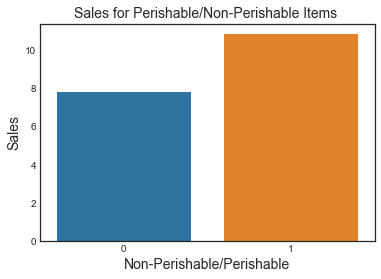

In [86]:
x = item_sales.groupby(['perishable'], as_index=False).agg({'unit_sales':'sum', 'item_nbr':'count'}) 
x['unit_sales_normalized'] = x['unit_sales']/x['item_nbr']
#Plotting perishable or not  Vs unit_sales
fig, ax = plt.subplots()
ax = sns.barplot(x = x.perishable, y= 'unit_sales_normalized', data = x)
plt.ylabel('Sales', fontsize= 14)
plt.xlabel('Non-Perishable/Perishable', fontsize= 14)
plt.title('Sales for Perishable/Non-Perishable Items ',fontsize= 14)
plt.show()


*  Perishable items have higher sales than perishable items

In [87]:
del item_sales ,df_items

# <font color='salmon'> EDA on Transactions Data

#### Checking Missing Values

In [92]:
resumetable(df_transactions).drop(1)


Dataset Shape: (83488, 3)


,Name,dtypes,Missing,Missing(% of Total values),Uniques,First Value,Second Value
0,date,datetime64[ns],0,0.0,1682,2013-01-01 00:00:00,2013-01-02 00:00:00
2,transactions,int64,0,0.0,4993,770,2111


#### No. of transactions per Month for Every Year

In [93]:
#Adding year , month and day of week as features
df_transactions["year"] = df_transactions["date"].dt.year
df_transactions["month"] = df_transactions["date"].dt.month
df_transactions['day_of_week'] = df_transactions['date'].dt.day_name()


df_transactions["year"] = df_transactions["year"].astype(str)
df_transactions.head()


,date,store_nbr,transactions,year,month,day_of_week
0,2013-01-01,25,770,2013,1,Tuesday
1,2013-01-02,1,2111,2013,1,Wednesday
2,2013-01-02,2,2358,2013,1,Wednesday
3,2013-01-02,3,3487,2013,1,Wednesday
4,2013-01-02,4,1922,2013,1,Wednesday


In [68]:
# Group by month, year and sum of transactions
x = df_transactions.groupby(['month', 'year'], as_index=False).agg({'transactions':'sum'})


In [69]:
#Plotting heat map of month , year and no. of transactions
y = x.pivot("month", "year", "transactions")
y

year,2013,2014,2015,2016,2017
month,,,,,
1,2289558.0,2393528.0,2489059.0,2371205.0,2612848.0
2,2169615.0,2278167.0,2345984.0,2465798.0,2448370.0
3,2458683.0,2545427.0,2625500.0,2607658.0,2680645.0
4,2344905.0,2455666.0,2533355.0,2631797.0,2667808.0
5,2467465.0,2503262.0,2673911.0,2666157.0,2801884.0
6,2392206.0,2399144.0,2530903.0,2491063.0,2668863.0
7,2401968.0,2442341.0,2604784.0,2594087.0,2784026.0
8,2461139.0,2537572.0,2675057.0,2536111.0,1335692.0
9,2380462.0,2449131.0,2545252.0,2436974.0,NaN


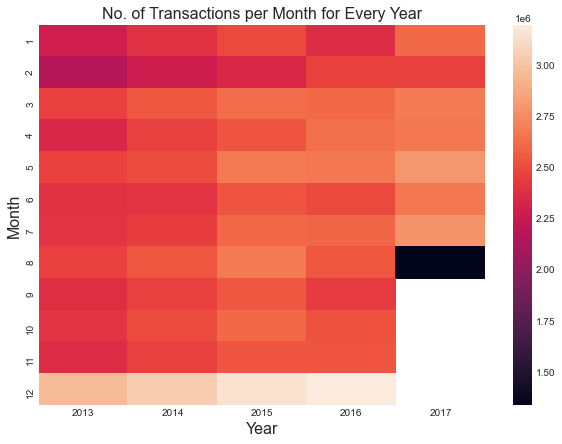

In [70]:
fig, ax = plt.subplots(figsize=(10,7))
sns.heatmap(y)
plt.xlabel('Year', fontsize= 16)
plt.ylabel('Month', fontsize= 16)
plt.title("No. of Transactions per Month for Every Year",fontsize= 16)
plt.show()

del x






*  December has the most transactions for all years 
*  With passing years, the squares are getting lighter, which indicates that the no. of transactions are increasing each year.

Note : Since we don´t have data after 15th August 2017 those squares appear blank.



#### No. of transactions per Day of Week for Every Year

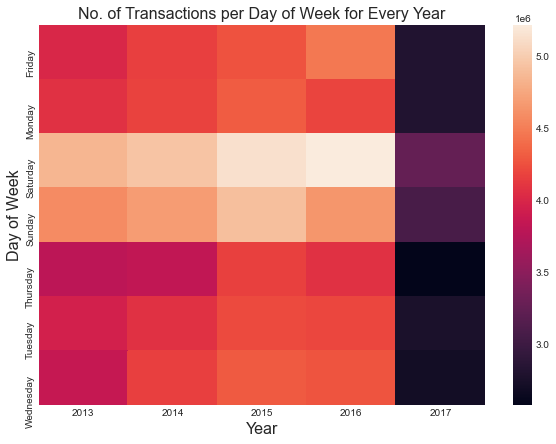

In [71]:
# Group by day_of_week, year and sum of transactions
x = df_transactions.groupby(['day_of_week', 'year'], as_index=False).agg({'transactions':'sum'})

#Plotting heat map of day_of_week , year and no. of transactions
y = x.pivot("day_of_week", "year", "transactions")
fig, ax = plt.subplots(figsize=(10,7))
sns.heatmap(y)
plt.xlabel('Year', fontsize= 16)
plt.ylabel('Day of Week', fontsize= 16)
plt.title("No. of Transactions per Day of Week for Every Year",fontsize= 16)

del x


* Saturday has the maximum no. of transactions followed by Saturday (i.e. Weekends seem to be prefered as compared to Weekdays to shop at this supermaket.)
* Saturday has more transactions than Sunday, But Sunday has higher sales than Saturday which means customers return products on Saturday.

Note : Year 2017 does not have 4 months of data, thats's why it appears that 2017 is performing worse as compared to other years.


#### No. of transactions per Store

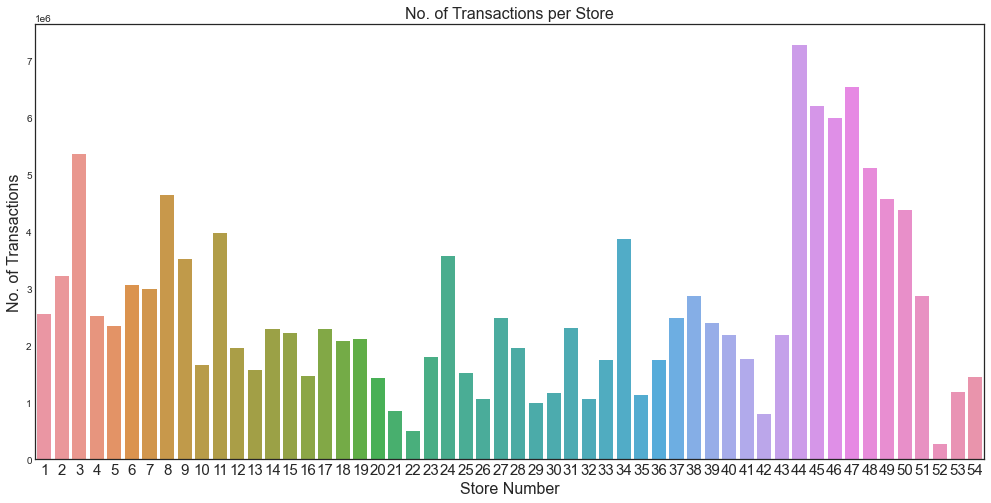

In [72]:
# Group by store_nbr and sum of transactions for each store_nbr
x = df_transactions.groupby(['store_nbr'], as_index=False).agg({'transactions':'sum'})
fig, ax = plt.subplots()
fig.set_size_inches(17, 8)
ax = sns.barplot(x = x.store_nbr, y= x.transactions)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0, fontsize = 15)
plt.title('No. of Transactions per Store',fontsize= 16)
plt.ylabel('No. of Transactions', fontsize= 16)
plt.xlabel('Store Number', fontsize= 16)
plt.show()

*   Store No. 44 has the maximum no. of transactions.
*   Store No. 52 has the minimum no. of transactions.


In [73]:
# Group by store_nbr, year and sum of transactions
x = df_transactions.groupby(['store_nbr', 'year'], as_index=False).agg({'transactions':'sum'})

#Plotting heat map of store_nbr , year and no. of transactions
y = x.pivot("store_nbr", "year", "transactions")
y

year,2013,2014,2015,2016,2017
store_nbr,,,,,
1,552779.0,558324.0,558606.0,544262.0,339992.0
2,687904.0,711493.0,708200.0,690682.0,421622.0
3,1141431.0,1166136.0,1175267.0,1164208.0,719308.0
4,553823.0,562575.0,551179.0,532250.0,319180.0
5,544017.0,543874.0,518930.0,460913.0,280143.0
6,663399.0,677306.0,666285.0,656387.0,402519.0
7,628847.0,659354.0,640704.0,654388.0,412700.0
8,1013479.0,1029991.0,1002385.0,980025.0,612091.0
9,803540.0,777642.0,753569.0,727923.0,453488.0


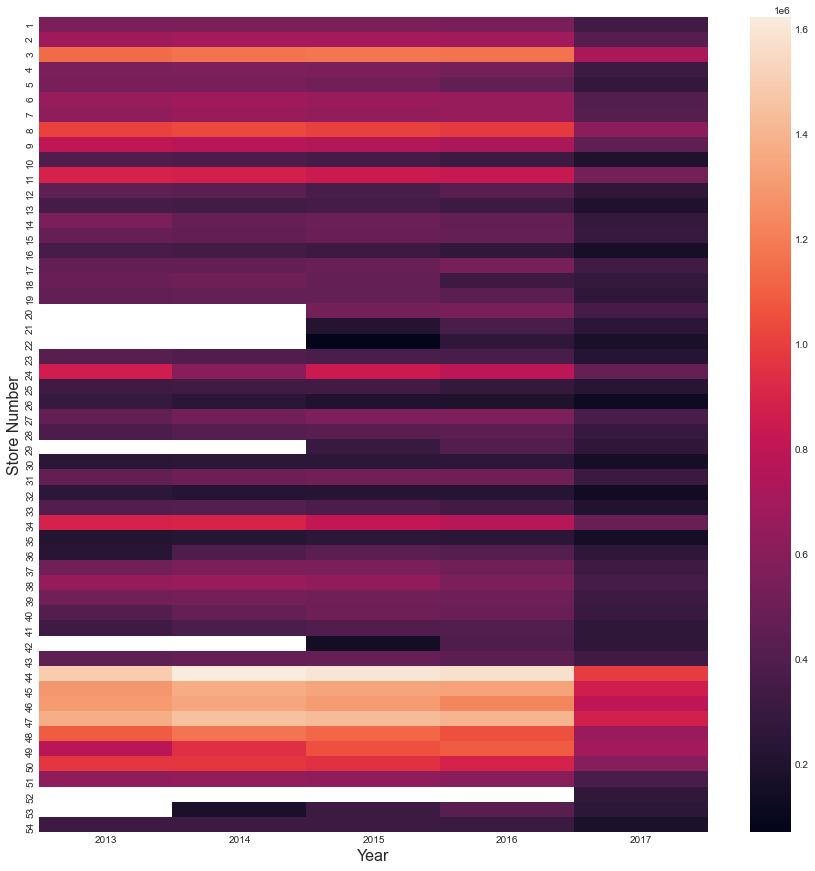

In [74]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(y)
plt.xlabel('Year', fontsize= 16)
plt.ylabel('Store Number', fontsize= 16)
plt.show()

* White boxes for store no. 20, 21, 22, 42 etc. shows that the particular store was not opened in that particular year (as there are no transactions).
* New Stores are opened yearly (for ex. store no. 42 was opened in year 2015 and store no. 53 was opened in year 2017 )

#### No. of Transactions per State for Every Year 

In [78]:
#Merging transactions dataframe and stores dataframe
transactions_store = pd.merge(df_transactions, df_stores, on='store_nbr')
transactions_store.head()


,date,store_nbr,transactions,year,month,day_of_week,city,state,type,cluster
0,2013-01-01,25,770,2013,1,Tuesday,Salinas,Santa Elena,D,1
1,2013-01-02,25,1038,2013,1,Wednesday,Salinas,Santa Elena,D,1
2,2013-01-03,25,887,2013,1,Thursday,Salinas,Santa Elena,D,1
3,2013-01-04,25,1054,2013,1,Friday,Salinas,Santa Elena,D,1
4,2013-01-05,25,1355,2013,1,Saturday,Salinas,Santa Elena,D,1


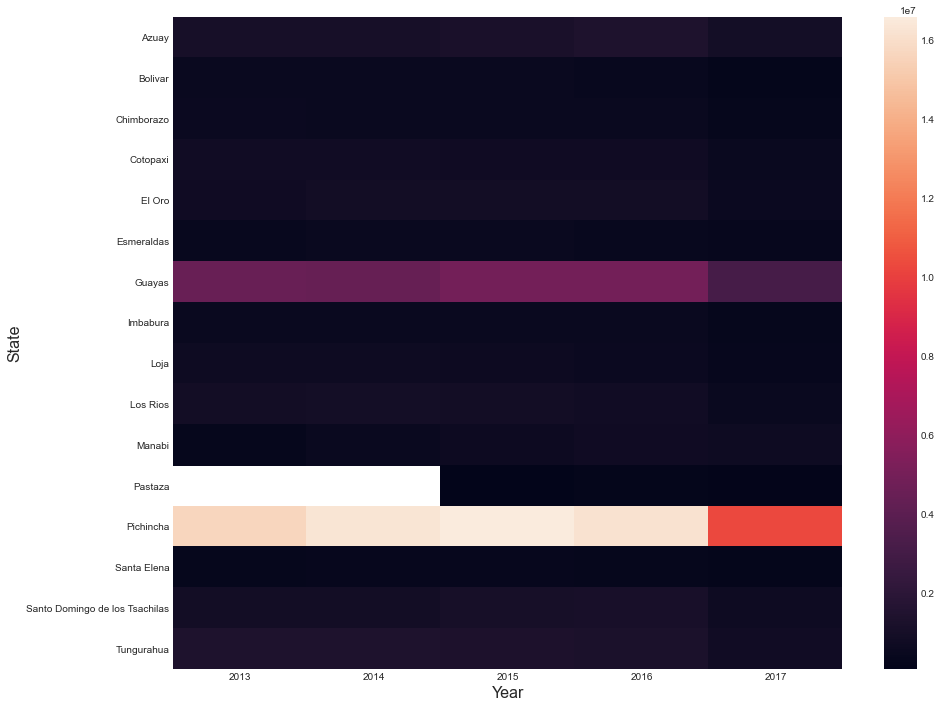

In [79]:
# Group by state, year and sum of transactions
x = transactions_store.groupby(['state', 'year'], as_index=False).agg({'transactions':'sum'})

#Plotting heat map of state , year and no. of transactions
y = x.pivot("state", "year", "transactions")
fig, ax = plt.subplots(figsize=(15,12))
sns.heatmap(y)
plt.xlabel('Year', fontsize= 16)
plt.ylabel('State', fontsize= 16)
plt.show()

* Pichincha State has maximum no. of transactions for all years followed by Guayas.
* Pastaza State did not have any stores in year 2013 and 2014

# <font color='salmon'> EDA On Holidays_events Dataset

#### Checking Missing Values 

In [95]:
resumetable(df_holidays_events)

Dataset Shape: (350, 6)


,Name,dtypes,Missing,Missing(% of Total values),Uniques,First Value,Second Value
0,date,datetime64[ns],0,0.0,312,2012-03-02 00:00:00,2012-04-01 00:00:00
1,type,object,0,0.0,6,Holiday,Holiday
2,locale,object,0,0.0,3,Local,Regional
3,locale_name,object,0,0.0,24,Manta,Cotopaxi
4,description,object,0,0.0,103,Fundacion de Manta,Provincializacion de Cotopaxi
5,transferred,bool,0,0.0,2,False,False


#### No. of Holidays per Locale

In [105]:
#Fetching no.of days for each locale 
holidays=df_holidays_events.locale.value_counts().to_frame()

,locale
National,174
Local,152
Regional,24


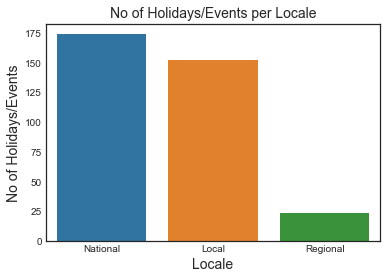

In [96]:
#Fetching no.of days for each locale 
holidays=df_holidays_events.locale.value_counts().to_frame()

##Plotting Locale Vs no_of_days
fig, ax = plt.subplots()
ax = sns.barplot(x = holidays.index, y= "locale",data=holidays)
plt.title('No of Holidays/Events per Locale',fontsize=14)
plt.xlabel('Locale',fontsize=14)
plt.ylabel('No of Holidays/Events',fontsize=14)
plt.show()

* Most no. of Holidays/Events are National followed by Local.


#### Sales per Locale

In [102]:
#Merging sales and holidays dataframe
holiday_sales=df_train.merge(df_holidays_events, how='inner', on='date')

holiday_sales=reduce_mem_usage(holiday_sales)

holiday_sales.head()

Memory usage of Dataframe is 1228.203 MB


  0%|          | 0/10 [00:00<?, ?it/s]

Memory usage after optimization is: 666.150 MB
Decreased by 45.8%


,date,store_nbr,item_nbr,unit_sales,onpromotion,type,locale,locale_name,description,transferred
0,2013-01-01,25,103665,7.0,NaN,Holiday,National,Ecuador,Primer dia del ano,0.0
1,2013-01-01,25,105574,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,0.0
2,2013-01-01,25,105575,2.0,NaN,Holiday,National,Ecuador,Primer dia del ano,0.0
3,2013-01-01,25,108079,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,0.0
4,2013-01-01,25,108701,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,0.0


In [104]:
x = holiday_sales.groupby(['locale'], as_index=False).agg({'unit_sales':'sum', 'locale':'count'}) 
x['unit_sales_normalized'] = x['unit_sales']/x['locale']
x.head()

,unit_sales,locale,unit_sales_normalized
0,76340296.0,8971601,8.509105
1,109147864.0,11468026,9.517581
2,12413596.0,1388581,8.939771


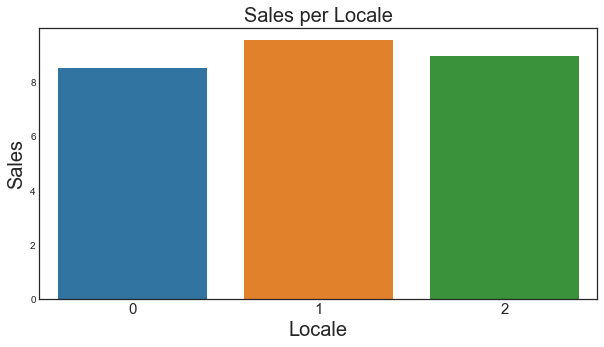

In [106]:
x = holiday_sales.groupby(['locale'], as_index=False).agg({'unit_sales':'sum', 'locale':'count'}) 
x['unit_sales_normalized'] = x['unit_sales']/x['locale']


#Plotting locale Vs unit_sales
fig, ax = plt.subplots()
fig.set_size_inches(10, 5)
ax = sns.barplot(x = x.index, y= 'unit_sales_normalized', data = x)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0, fontsize = 15)
plt.ylabel('Sales', fontsize= 20)
plt.xlabel('Locale', fontsize= 20)
plt.title('Sales per Locale',fontsize= 20)
plt.show()

* Maximum sales happens on Local Holidays/Events followed Regional Holidays/Events

#### No. of Holidays per Locale Name

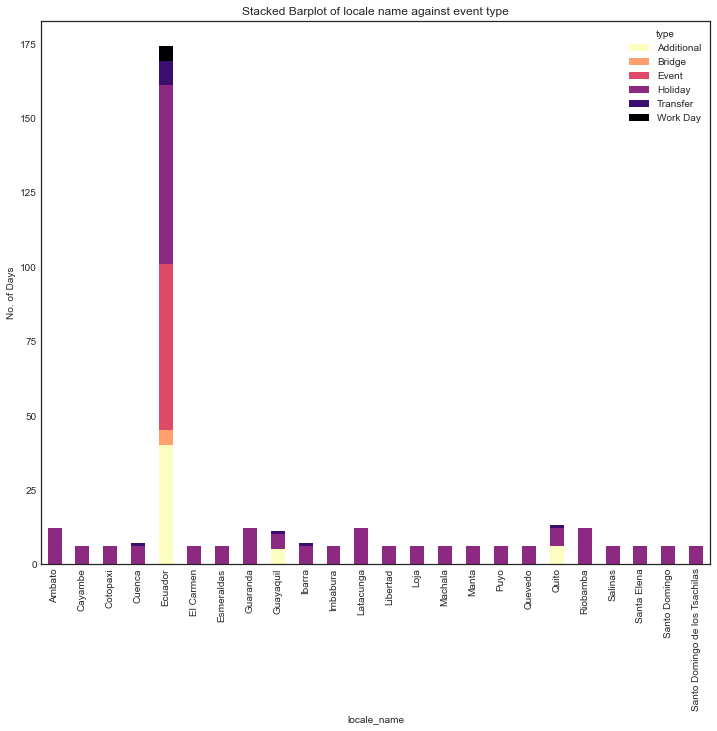

In [107]:
#Group by locale_name,type
x = df_holidays_events.groupby(['locale_name', 'type']).size()

#Plotting stacked barplot of Locale_name and type Vs no_of_days
x.unstack().plot(kind='bar',stacked=True, colormap= 'magma_r', figsize=(12,10),  grid=False)
plt.title('Stacked Barplot of locale name against event type')
plt.ylabel('No. of Days')
plt.show()

* Ecuador have most no. of holidays/events of all types.
* Most locales have similar no. and type of holidays

#### Sales per Locale Name

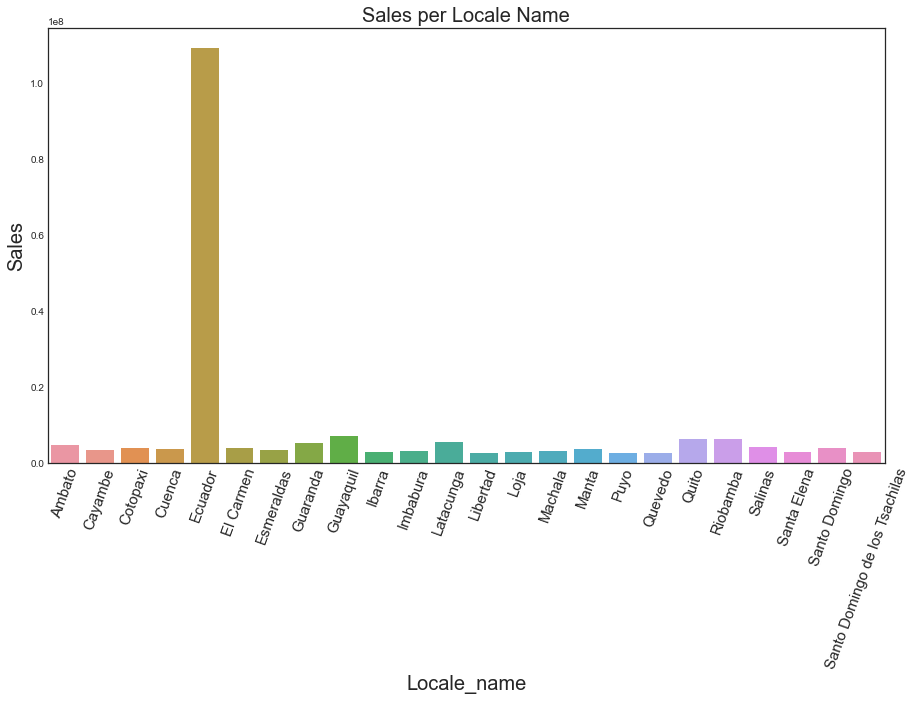

In [108]:
#Group by locale_name and sum of sales for each locale_name
x = holiday_sales.groupby(['locale_name'], as_index=False).agg({'unit_sales':'sum'}) 

#Plotting locale_name Vs unit_sales
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
ax = sns.barplot(x = x.locale_name, y= "unit_sales", data = x)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 70, fontsize = 15)
plt.ylabel('Sales', fontsize= 20)
plt.xlabel('Locale_name', fontsize= 20)
plt.title('Sales per Locale Name',fontsize= 20)
plt.show()

* Ecuador has maximum sales.
* Most locales have similar sales.

#### No. of Days per Type

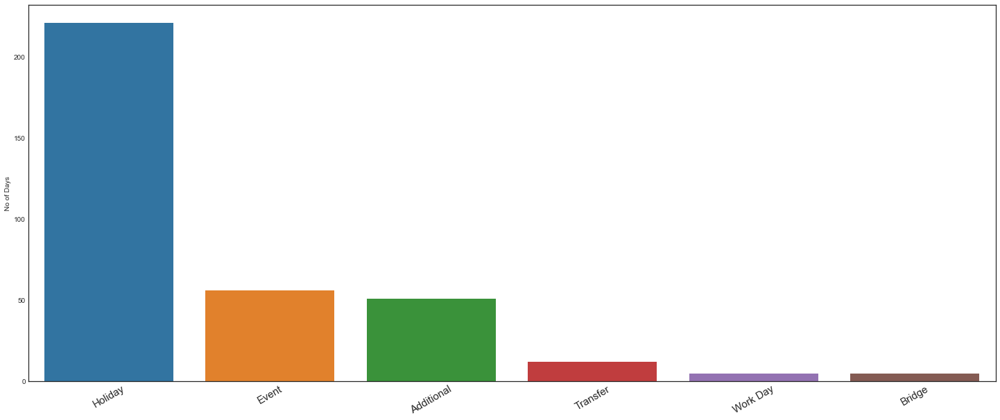

In [87]:
#Fetching no.of days for each holiday type
holidays = df_holidays_events.type.value_counts().to_frame()

#Plotting holiday type Vs no_of_days
fig, ax = plt.subplots()
fig.set_size_inches(25, 10)
ax = sns.barplot(x = holidays.index, y= "type",data=holidays)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 30, fontsize = 15)
plt.ylabel('No of Days')
plt.show()

*  Most no. of special days are of type Holiday.
* Bridge type and Work Day type has equal number of days.As bridge is extra holiday that are added to get a long break weekend. And those holiday needed to be pay back by 'Work Day'.
* The transfer type means officially that day is not a holiday, but some holiday is transferred to that day. (Those whose 'transferred' is true. )

#### Sales per Type

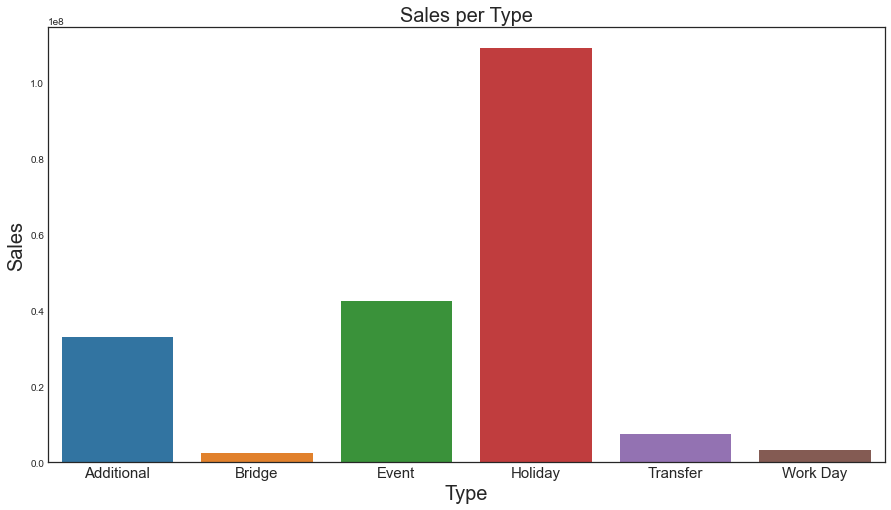

In [88]:
#Group by holiday type  and sum of unit_sales for each holiday type
x = holiday_sales.groupby(['type'], as_index=False).agg({'unit_sales':'sum'}) 

#Plotting holiday type Vs unit_sales
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
ax = sns.barplot(x = x.type, y= "unit_sales", data = x)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0, fontsize = 15)
plt.ylabel('Sales', fontsize= 20)
plt.xlabel('Type', fontsize= 20)
plt.title('Sales per Type',fontsize= 20)
plt.show()

* Special Days of type Holiday and Event have higher sales as compared to other types.
* Bridge and Work day have lowest Sales

#### No. of Holidays Transferred/Non-Transferred

In [89]:
#Pie plot showing information about transferred column

x=go.Pie( labels = df_holidays_events.transferred.value_counts().index,
    values = df_holidays_events.transferred.value_counts().values,
    domain = dict(x=[0.52, 1], y=[0.51, 1]),
    showlegend = False,
    text = ['False', 'True'],
    hoverinfo="text+percent",
    textinfo="text+value",
    hole = 0.3
)

holiday_layout = dict(
    width=800, height=800,
    annotations= [
        
        
        dict(
            font=dict(
                size=15,
                family="Droid Sans"
            ),
            text = "Transferred",
            x = 0.82, y=0.78,
            showarrow=False
        )
        
        
    ]
)
x = go.Figure(data=x,layout = holiday_layout)

py.iplot(x)



*  The majority of holidays/events are not transferred.

* The transfer type means officially that day is not a holiday, but some holiday is transferred to that day. (Those whose 'transferred' is true. ) Therefore, 12 holiday have 'transferred' as true, and 12 holiday has 'type' as 'transfer'.

#### Sales for Transferred/Non-Transferred Holidays

In [90]:
# Changing datatype of transferred column to integer
holiday_sales['transferred']=holiday_sales['transferred'].astype(int)

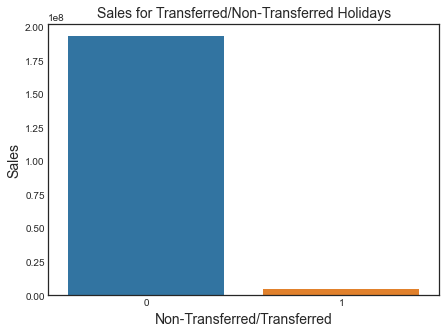

In [91]:
#Group by transferred feature and sum of unit_sales for each transferred type i.e. 0 or 1
x = holiday_sales.groupby(['transferred'], as_index=False).agg({'unit_sales':'sum'}) 
fig, ax = plt.subplots()
fig.set_size_inches(7, 5)
ax = sns.barplot(x = x.transferred, y= "unit_sales", data = x)
plt.ylabel('Sales', fontsize= 14)
plt.xlabel('Non-Transferred/Transferred', fontsize= 14)
plt.title('Sales for Transferred/Non-Transferred Holidays',fontsize= 14)
plt.show()

* Sales for non-transferred days are high(as no. of non-transferred days are far more than transferred days)

# <font color='salmon'> EDA on Oil Dataset

This dataset contains the daily oil price, since ecuador is an oil dependent, and we are trying to understand about sales, which has to do something with economics.

#### Checking Missing Values

In [12]:
resumetable(df_oil)


Dataset Shape: (1218, 2)


,Name,dtypes,Missing,Missing(% of Total values),Uniques,First Value,Second Value
0,date,datetime64[ns],0,0.000000,1218,2013-01-01,2013-01-02 00:00:00
1,dcoilwtico,float64,43,3.530378,998,NaT,93.14


#### Oil price over Date

In [13]:
trace = go.Scatter(
    x=df_oil['date'], 
    y=df_oil['dcoilwtico'], 
    mode='lines+markers', 
    marker=dict(size=2, color = 'rgba(0, 152, 0, .8)'),
    fill='tonexty')
data = [trace]
layout = dict(title="Oil price over Date ", 
             yaxis=dict(title="Oil price"))
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)


* The oil price reaches its peak around Sep. 2013 with around $110 . 
* From July 2014, the oil price started decreasing drastically until March 2015.
* From July 2016 to July 2017 the oil price is relatively stable.



#### Oil Price and Unit Sales over Date


In [14]:
# #Filtering data only for year 2016
# df_oil_2016=df_oil[df_oil["date"].dt.year==2016]
# df_oil_2016

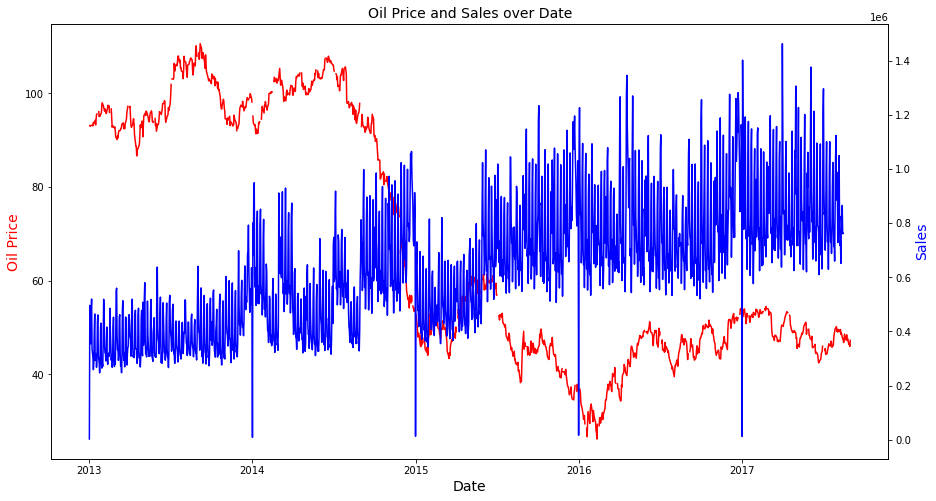

In [19]:
#Plotting date vs oil price(1st y axis) 
fig,ax = plt.subplots()
fig.set_size_inches(15, 8)
ax.plot(df_oil["date"], df_oil.dcoilwtico, color="red")

# set x-axis label
ax.set_xlabel("Date",fontsize=14)
# set y-axis label
ax.set_ylabel("Oil Price",color="red",fontsize=14)
ax.figsize=(50,11)
x = df_train.groupby("date").agg({"unit_sales":"sum"})
#Plotting date vs unit_sales(2nd y axis) 
ax2=ax.twinx()   # twin object for two different y-axis on the sample plot
ax2.plot(x.index, x["unit_sales"],color="blue")  # make a plot with different y-axis using second axis object
ax2.set_ylabel("Sales",color="blue",fontsize=14)
plt.title('Oil Price and Sales over Date',fontsize=14)
plt.show()


### <font color='salmon'> Correlation / Regression

#### <font color='navy'> Question 3 - Is there any statistically significant relation between  Oil price and Sales of the stores ?

* Null Hypothesis H0        = Oil price and Sales are independent from each other.
* Alternative Hypothesis HA = Oil price and Sales are not independent of each other. There is a relationship between them.


* Oil Price - Independent continuous variable
* Sales - Dependent continuous variable

##### We will do Simple Linear Regression now

In [75]:
x = df_train.groupby("date").agg({"unit_sales":"sum"})
train = pd.merge(x, df_oil, on= "date")

In [76]:
lm0 = smf.ols(formula = 'unit_sales ~ dcoilwtico', data = train).fit()

In [34]:
#print the Result 
print(lm0.summary())

                            OLS Regression Results                            
Dep. Variable:             unit_sales   R-squared:                       0.497
Model:                            OLS   Adj. R-squared:                  0.497
Method:                 Least Squares   F-statistic:                     1147.
Date:                Sun, 15 Aug 2021   Prob (F-statistic):          1.77e-175
Time:                        12:25:36   Log-Likelihood:                -15409.
No. Observations:                1163   AIC:                         3.082e+04
Df Residuals:                    1161   BIC:                         3.083e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   9.348e+05   1.14e+04     81.991      0.0

There is a significant relationship between oil price and unit_sales as depicted by the p-value

In [20]:
x.to_csv("unit_sales_by_date")

### Summary

* Day of Week, Month would also be added as features for sales prediciton. 
* Store Features such as city, state, type, and cluster are important for predicting sales.
* Item Features including family, class, and perishable are also important and would be used for prediction.
* Locale and Type of Holiday/events features can also be considered.
* Oil price is related so it can also be considered.

#  <font color='salmon'>Final Data 

In [13]:
!jt -t chesterish

In [15]:
del train

NameError: name 'train' is not defined

In [ ]:
store_nbr = [44]
# item_nbr = [1503844, 1047679, 1473474, 364606, 819932]364606_Store_44_EDA -Copy1

item_nbr = [ 265559,  314384,  903283,  502331,  559870,  584028, 1047679, 1473474, 1503847, 1695931, 1642399, 1584575]
state = ["Pichincha", "Esmeraldas"]
city = ["Cayambe", "Quito"]
store_type = ["A"]
cluster = [5]
family = ["POULTRY", "PRODUCE", "BEVERAGES","MEATS", "EGGS", "FROZEN FOODS", "GROCERY I"]
holidays = ["Regional", "Locale"]
locale_name = "Ecuador"
newdf = df_train[(df_train.store_nbr.isin(store_nbr)) & (df_train.item_nbr.isin(item_nbr))]

In [ ]:
train = pd.merge(newdf, df_stores, on= "store_nbr", how = "left")
train = pd.merge(train, df_items, on= "item_nbr", how = "left")
# train = pd.merge(train, df_holidays_events, on="date", how = "left")
train = pd.merge(train, df_oil, on ="date", how = "left")
train = pd.merge(train, df_transactions, how= 'left', left_on= ['date','store_nbr'], right_on = ['date','store_nbr'])

In [17]:
# train.rename(columns = {'type_x':'store_type', 'type_y': 'holiday_type' }, inplace = True)
   

In [18]:
# train.drop("description", axis=1, inplace= True)

In [19]:
#Adding year , month and day of week as features
# train["year"] = train["date"].dt.year
# train["month"] = train["date"].dt.month
# train['day_of_week'] = train['date'].dt.day_name()
# train['date_only']  = train['date'].apply(lambda x: (str(x)[8:10]))


Wage Payment days have no impact on the sales on an average

In [ ]:
reduce_mem_usage(train)

In [ ]:
train.tail()

In [ ]:
train["transactions"]=train["transactions"].astype(float)
train["dcoilwtico"]=train["dcoilwtico"].astype(float)
train["unit_sales"]=train["unit_sales"].astype(float)
train["store_nbr"]=train["store_nbr"].astype(int)

In [ ]:
resumetable(train)

In [ ]:
train["transactions"]=train["transactions"].fillna(method='ffill')
train["dcoilwtico"]=train["dcoilwtico"].fillna(method='ffill')

In [ ]:
train["onpromotion"] = train["onpromotion"].astype("str")

In [ ]:
train['onpromotion'] = train['onpromotion'].map({'False': 0, 'True': 1})

In [ ]:
train['onpromotion'].fillna(0, inplace = True)

In [ ]:
cols = ["date","store_nbr", "item_nbr" , "onpromotion", "family", "class", "perishable", 
        "dcoilwtico", "transactions", "unit_sales"]

In [ ]:
train_1 = train[cols]

In [ ]:
resumetable(train_1)

In [ ]:
train_1.to_csv("44_item")

#  <font color='salmon'>  Analysis

In [30]:
# del train

In [31]:
# train = pd.read_csv(
#     'Sales2', index_col= "date",
#     parse_dates=["date"], low_memory = False)
# train.head()

,Unnamed: 0,store_nbr,onpromotion,dcoilwtico,transactions,unit_sales
date,,,,,,
2014-01-02,0,3,0.0,95.14,3350.0,615.122009
2014-01-02,1,44,0.0,95.14,4422.0,966.148987
2014-01-02,2,45,0.0,95.14,4235.0,685.392029
2014-01-02,3,47,0.0,95.14,4334.0,643.932007
2014-01-02,4,49,0.0,95.14,2463.0,399.175995


In [49]:
resumetable(train)

Dataset Shape: (5080, 6)


,Name,dtypes,Missing,Missing(% of Total values),Uniques,First Value,Second Value
0,date,datetime64[ns],0,0.0,1016,2014-01-02 00:00:00,2014-01-02 00:00:00
1,store_nbr,int32,0,0.0,5,3,44
2,onpromotion,float64,0,0.0,2,0.0,0.0
3,dcoilwtico,float64,0,0.0,495,95.125,95.125
4,transactions,float64,0,0.0,1278,3350.0,4424.0
5,unit_sales,float64,0,0.0,2003,615.0,966.0


date            0
store_nbr       0
onpromotion     0
dcoilwtico      0
transactions    0
unit_sales      0
dtype: int64

In [91]:
train['store_nbr'].unique()

array([ 3, 44, 45, 47, 49])

In [53]:
# train.drop( 'Unnamed: 0', axis=1 , inplace= True)

In [109]:
df = train.set_index('date').groupby('store_nbr').resample('D').mean()
df.dropna(inplace=True)

store_nbr  onpromotion  dcoilwtico  transactions  \
store_nbr date                                                           
3         2014-01-02        3.0          0.0    95.12500        3350.0   
          2014-01-03        3.0          0.0    93.68750        3348.0   
          2014-01-04        3.0          0.0    93.68750        3810.0   
          2014-01-05        3.0          0.0    93.68750        3634.0   
          2014-01-06        3.0          0.0    93.12500        3010.0   
...                         ...          ...         ...           ...   
49        2017-08-11       49.0          0.0    48.81250        3116.0   
          2017-08-12       49.0          0.0    48.81250        2984.0   
          2017-08-13       49.0          0.0    48.81250        3028.0   
          2017-08-14       49.0          0.0    47.59375        2916.0   
          2017-08-15       49.0          0.0    47.56250        2814.0   

                      unit_sales  
store_nbr date                    
3         2014-01-02     615.000  
          2014-01-03     578.000  
          2014-01-04     804.500  
          2014-01-05     507.000  
          2014-01-06     153.125  
...                          ...  
49        2017-08-11     468.500  
          2017-08-12     507.750  
          2017-08-13     625.000  
          2017-08-14     622.500  
          2017-08-15     426.250  

[5080 rows x 5 columns]

In [114]:
df.isnull().sum()

onpromotion     0
dcoilwtico      0
transactions    0
unit_sales      0
dtype: int64

In [111]:
df.drop('store_nbr', axis=1, inplace=True)

In [115]:
df.onpromotion.unique()

array([0., 1.])

In [116]:
df=df.reset_index()

In [119]:
df1 = df[df.date>= '2015-07-01']

In [144]:
import matplotlib as mpl



mpl.rcParams['figure.figsize'] = (20, 16)
mpl.rcParams['axes.grid'] = False

<AxesSubplot:xlabel='date'>

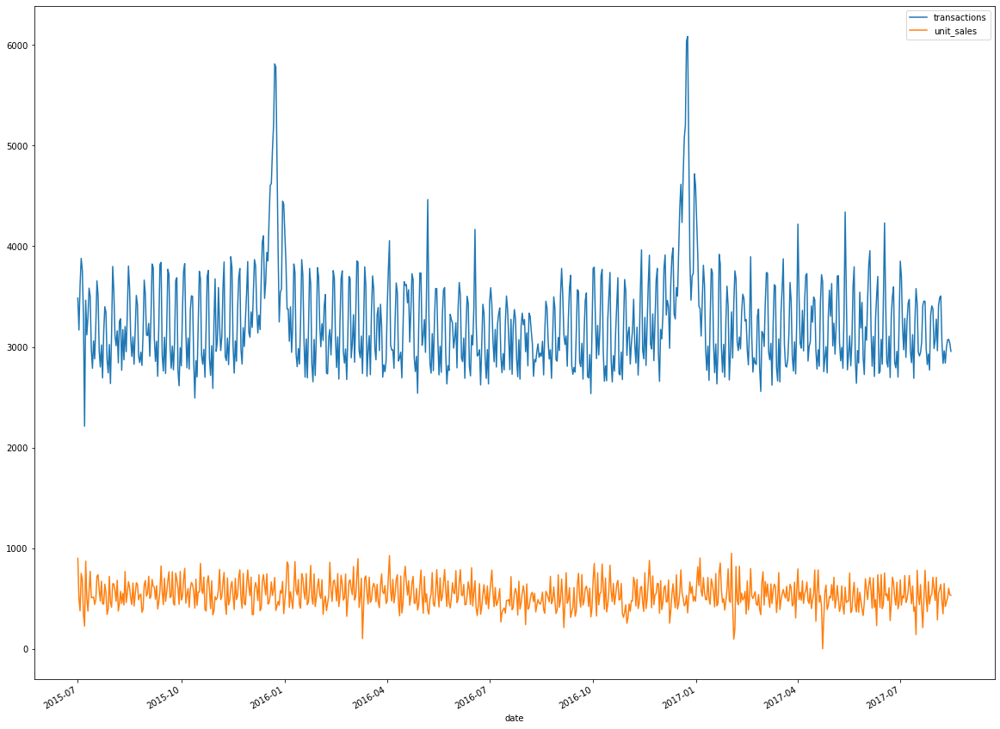

In [145]:
df_3= df1.set_index('date').query("store_nbr==3")[['transactions', "unit_sales"]]
df_3.plot()

<AxesSubplot:xlabel='date'>

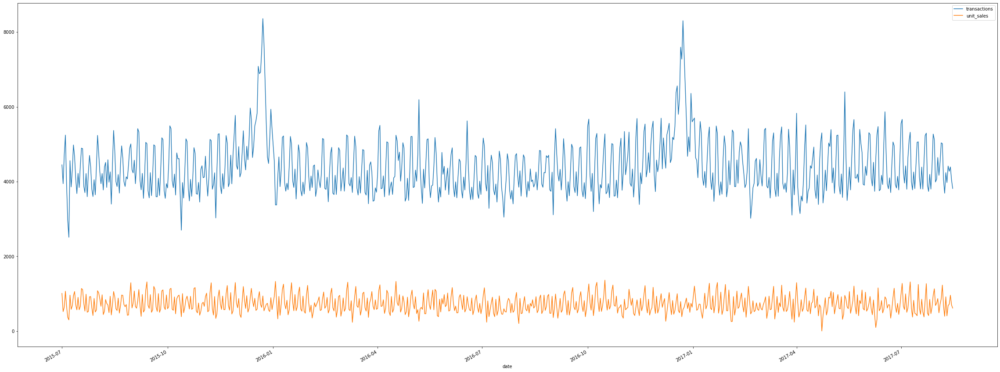

In [182]:
df_44 = df1.set_index('date').query("store_nbr==44")
df_44[['transactions', "unit_sales"]].plot()

<AxesSubplot:xlabel='date'>

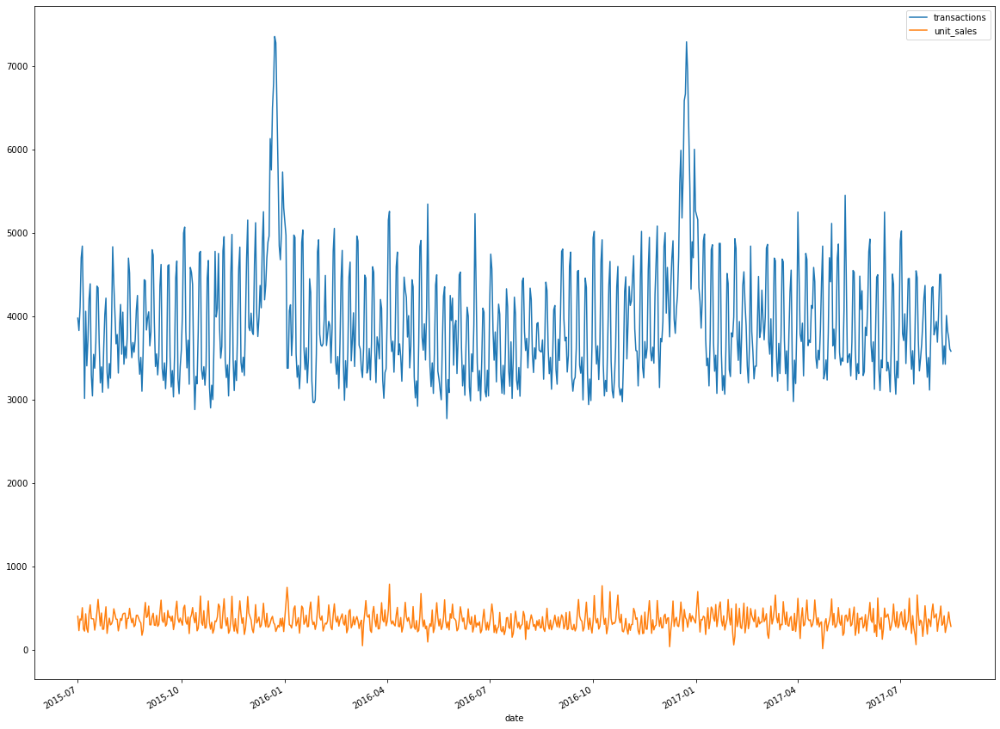

In [131]:
df_47= df1.set_index('date').query("store_nbr==47")[['transactions', "unit_sales"]]
df_47.plot()

<AxesSubplot:xlabel='date'>

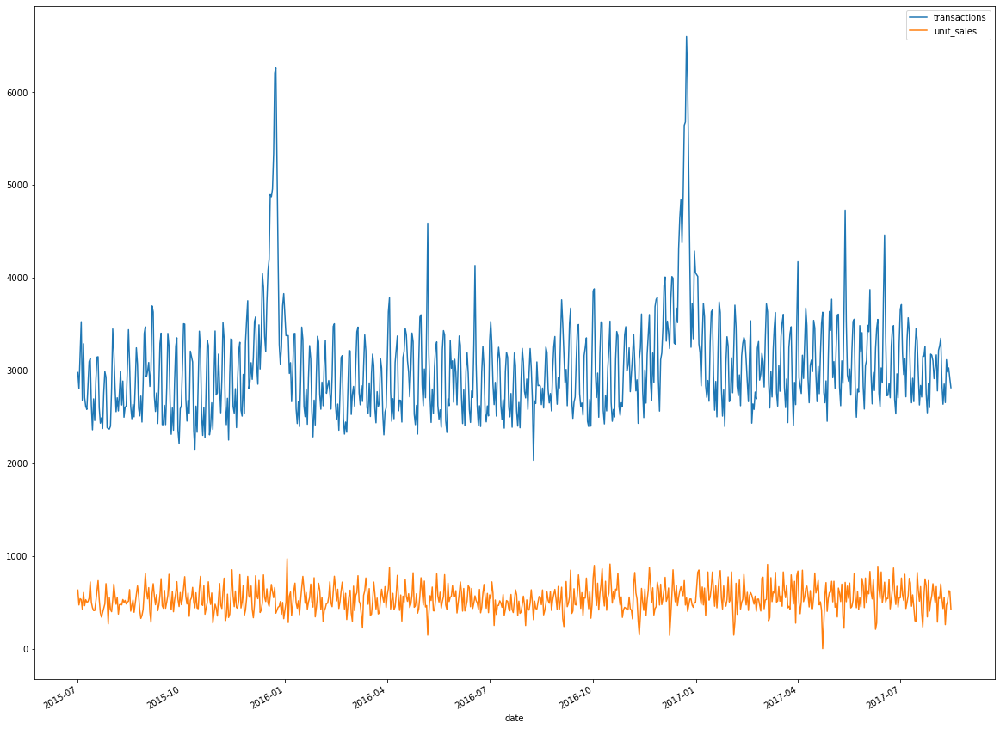

In [130]:
df_49= df1.set_index('date').query("store_nbr==49")[['transactions', "unit_sales"]]
df_49.plot()

<AxesSubplot:xlabel='date'>

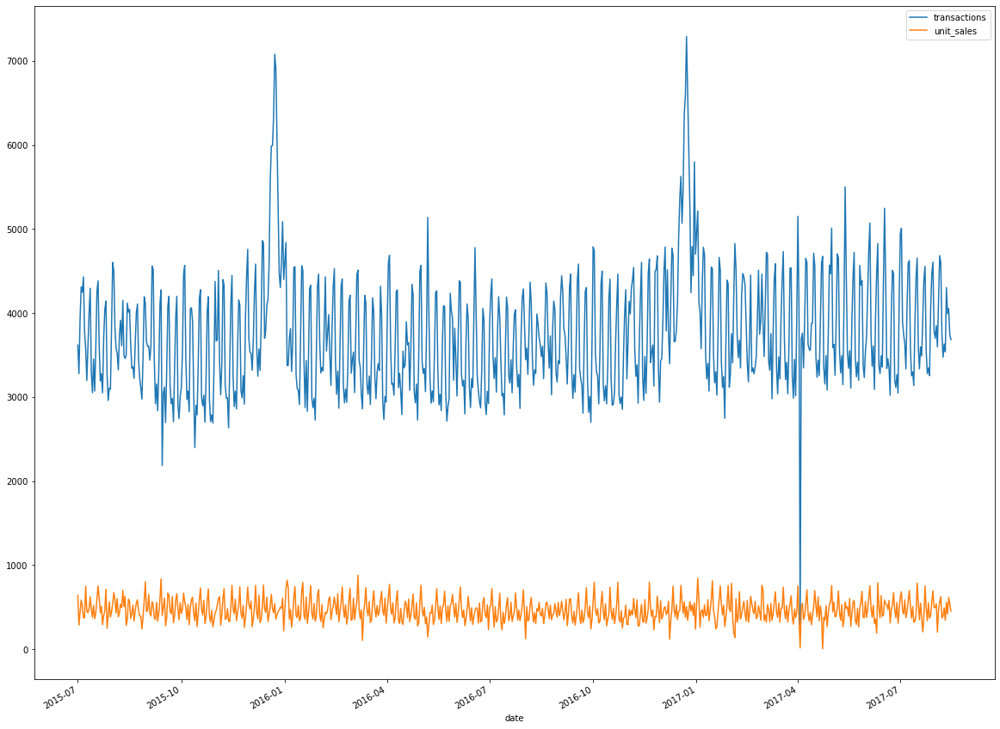

In [129]:
df_45= df1.set_index('date').query("store_nbr==45")[['transactions', "unit_sales"]]
df_45.plot()

In [ ]:
train.corr(method='spearman')

As seen from the unit_sales column none of the correlation are high

#  <font color='salmon'> Stationarity Test

### <font color='salmon'> KPSS

Null hypothesis - data is stationary

Alternate hypothesis - data is not stationary

In [136]:
from statsmodels.tsa.stattools import kpss

stats, p, lags, critical_values = kpss(df_44['unit_sales'], 'c')

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1906: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




In [137]:
print(f'Test Statistics: {stats}')
print(f'p-value: {p}')
print(f'Critial Values: {critical_values}')

if p < 0.05 :
  print('Series is not Stationary')
else:
  print('Series is Stationary')


Test Statistics: 0.7930024497882459
p-value: 0.01
Critial Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Series is not Stationary


### <font color='salmon'> Dickey Fuller Test

Null Hypothesis - Series possesses a unit root and hence is not stationary

Alternate Hypothesis - Series is stationary

In [138]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(df_44['unit_sales'])

In [139]:
print(f'Test Statistics: {result[0]}')
print(f'p-value: {result[1]}')
print(f'Critial Values: {result[4]}')

if result[1] > 0.05 :
  print('Series is not Stationary')
else:
  print('Series is Stationary')

Test Statistics: -4.593809898447963
p-value: 0.0001326059395408804
Critial Values: {'1%': -3.4390874066174355, '5%': -2.8653962034740705, '10%': -2.568823449196012}
Series is Stationary


# <font color='salmon'> Decomposition

In [167]:
import matplotlib as mpl



mpl.rcParams['figure.figsize'] = (40, 16)
mpl.rcParams['axes.grid'] = False

In [155]:
df_month = train.set_index('date').groupby('store_nbr').resample('M').mean()
df_month.dropna(inplace=True)
df_month.drop('store_nbr', axis=1, inplace=True)
df_month.reset_index(inplace=True)
df_month1= df_month[df_month.date>= '2015-07-01']
df_month1.head()

In [193]:
df_year = train.set_index('date').groupby('store_nbr').resample('A').mean()
df_year.head()

store_nbr  onpromotion  dcoilwtico  transactions  \
store_nbr date                                                           
3         2014-12-31          3     0.107981   87.488556   3237.323944   
          2015-12-31          3     0.145540   46.502641   3293.624413   
          2016-12-31          3     0.140110   43.230039   3227.412088   
          2017-12-31          3     0.141593   49.464325   3182.778761   
44        2014-12-31         44     0.107981   87.488556   4524.901408   

                      unit_sales  
store_nbr date                    
3         2014-12-31  559.525528  
          2015-12-31  560.825117  
          2016-12-31  540.429258  
          2017-12-31  531.141908  
44        2014-12-31  781.084507

In [194]:
df_year.dropna(inplace=True)

In [195]:


df_year.drop('store_nbr', axis=1, inplace=True)
df_year.reset_index(inplace=True)
# df_year1= df_month[df_year.date>= '2015-07-01']
# df_year1.head()

<AxesSubplot:xlabel='date'>

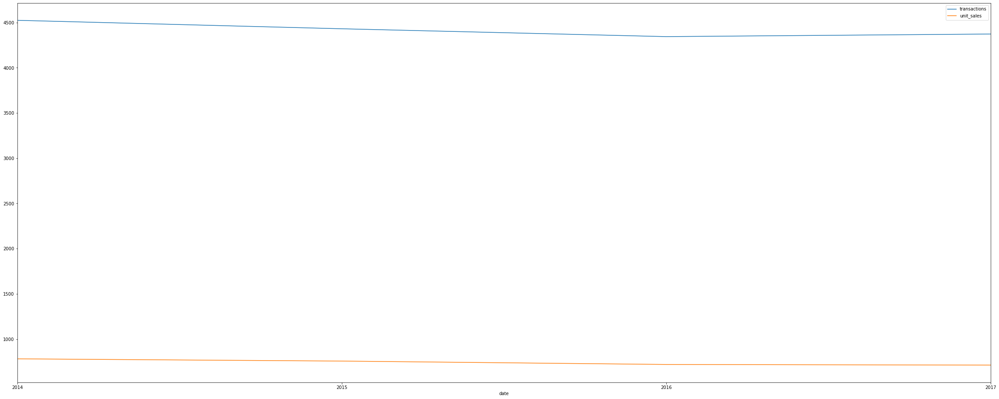

In [196]:
df_44_year= df_year.set_index('date').query("store_nbr==44")
df_44_year[['transactions', "unit_sales"]].plot()

<AxesSubplot:xlabel='date'>

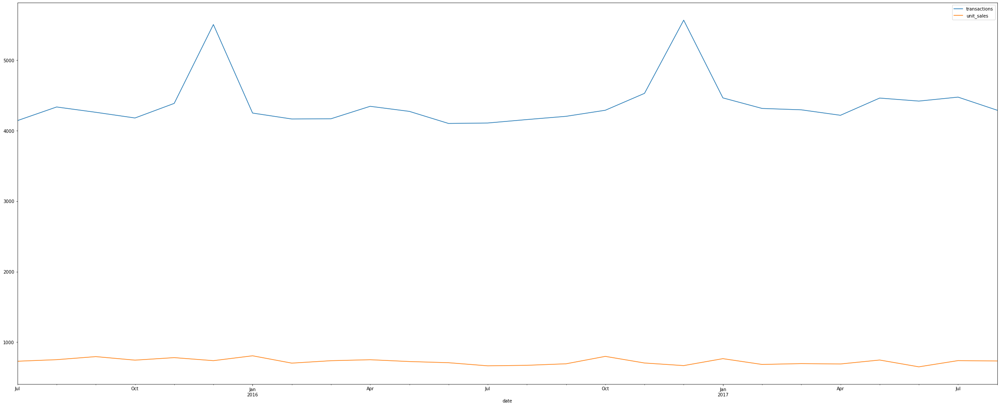

In [172]:
df_44_month= df_month1.set_index('date').query("store_nbr==44")[['transactions', "unit_sales"]]
df_44_month.plot()

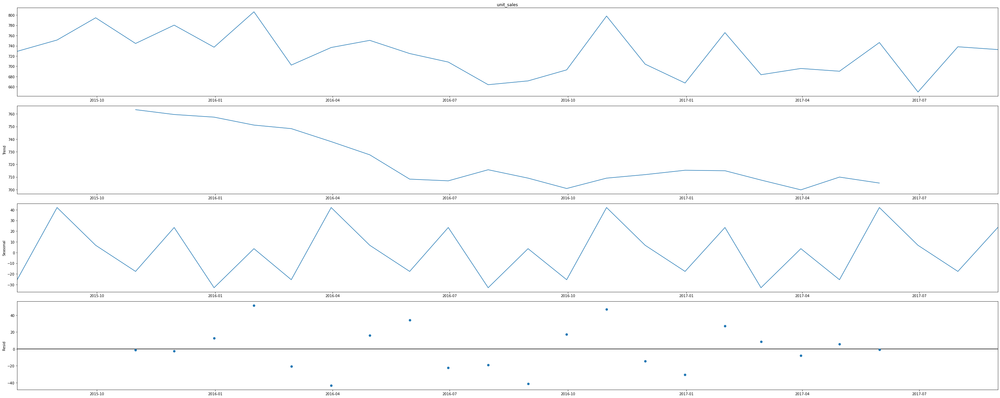

In [175]:
import statsmodels.api as sm
# seasonal_decompose(df, model='additive', freq=365).plot()
res = sm.tsa.seasonal_decompose(df_44_month['unit_sales'], freq=7)

resplot = res.plot()

# <font color='salmon'> Granger Causality

H0: Xt does not granger causes Yt

H1: Xt granger causes Yt

In [176]:
from statsmodels.tsa.stattools import grangercausalitytests

In [186]:
max_lags = 7
results=grangercausalitytests(df_44[['unit_sales','transactions']], max_lags, verbose=False)

In [187]:
p_values=[round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
print('P Values per lag - '+str(p_values))

P Values per lag - [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


In [185]:
max_lags = 4
results=grangercausalitytests(df_44[['unit_sales','dcoilwtico']], max_lags, verbose=False)
p_values=[round(results[i+1][0]['ssr_ftest'][1],4) for i in range(max_lags)]
print('P Values per lag - '+str(p_values))

P Values per lag - [0.3227, 0.349, 0.4566, 0.1835]


In [198]:
df_44.to_csv("Sales_44")
pd.read_csv("Sales_44")

,date,store_nbr,onpromotion,dcoilwtico,transactions,unit_sales
0,2015-07-01,44,1.0,56.93750,4448.0,1008.5
1,2015-07-02,44,0.0,56.93750,3944.0,522.0
2,2015-07-03,44,0.0,56.93750,4728.0,639.0
3,2015-07-04,44,0.0,56.93750,5244.0,1068.0
4,2015-07-05,44,0.0,56.93750,3952.0,669.5
...,...,...,...,...,...,...
768,2017-08-11,44,0.0,48.81250,4416.0,682.5
769,2017-08-12,44,0.0,48.81250,4276.0,721.0
770,2017-08-13,44,0.0,48.81250,4392.0,960.0
771,2017-08-14,44,0.0,47.59375,4040.0,696.5


In [199]:
df_44

,store_nbr,onpromotion,dcoilwtico,transactions,unit_sales
date,,,,,
2015-07-01,44,1.0,56.93750,4448.0,1008.5
2015-07-02,44,0.0,56.93750,3944.0,522.0
2015-07-03,44,0.0,56.93750,4728.0,639.0
2015-07-04,44,0.0,56.93750,5244.0,1068.0
2015-07-05,44,0.0,56.93750,3952.0,669.5
...,...,...,...,...,...
2017-08-11,44,0.0,48.81250,4416.0,682.5
2017-08-12,44,0.0,48.81250,4276.0,721.0
2017-08-13,44,0.0,48.81250,4392.0,960.0
